In [1]:
notebook_mode = True
viz_mode = False

<details>
<summary>Ceci est ma section repliable</summary>

Contenu de la section ici.

</details>

In [2]:
import os
import json
import argparse
import time

import numpy as np

import torch
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn

import matplotlib
import matplotlib.pyplot as plt

import networkx as nx
from sklearn.utils.class_weight import compute_class_weight

from tensorboardX import SummaryWriter
from fastprogress import master_bar, progress_bar

# Remove warning
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
from scipy.sparse import SparseEfficiencyWarning
warnings.simplefilter('ignore', SparseEfficiencyWarning)

from config import *
from utils.graph_utils import *
from utils.google_tsp_reader import GoogleTSPReader
from utils.plot_utils import *
# from models.gcn_model import ResidualGatedGCNModel
from utils.model_utils import *

In [3]:
if notebook_mode == True:
    %load_ext autoreload
    %autoreload 2
    %matplotlib inline
    from IPython.display import set_matplotlib_formats
    set_matplotlib_formats('png')

/var/folders/1w/9c6ht6r16hbb25q5hfmh8ttm0000gn/T/ipykernel_56318/3855748638.py:6: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png')


** Load configurations **

In [4]:
if notebook_mode==False:
    parser = argparse.ArgumentParser(description='gcn_tsp_parser')
    parser.add_argument('-c','--config', type=str, default="configs/default.json")
    args = parser.parse_args()
    config_path = args.config
elif viz_mode == True:
    config_path = "logs/tsp100/config.json"
else:
    config_path = "configs/default.json"

config = get_config(config_path)
print("Loaded {}:\n{}".format(config_path, config))

Loaded configs/default.json:
{'expt_name': 'deafult', 'gpu_id': '0', 'train_filepath': './data/tsp10_train_concorde.txt', 'val_filepath': './data/tsp10_val_concorde.txt', 'test_filepath': './data/tsp10_test_concorde.txt', 'num_nodes': 10, 'num_neighbors': 5, 'node_dim': 2, 'voc_nodes_in': 2, 'voc_nodes_out': 2, 'voc_edges_in': 3, 'voc_edges_out': 2, 'beam_size': 10, 'hidden_dim': 50, 'num_layers': 3, 'mlp_layers': 2, 'aggregation': 'mean', 'max_epochs': 2, 'val_every': 5, 'test_every': 10, 'batch_size': 3, 'batches_per_epoch': 10, 'accumulation_steps': 1, 'learning_rate': 0.001, 'decay_rate': 1.01}


In [5]:
# Over-ride config params (for viz_mode)
if viz_mode==True:
    config.gpu_id = "0"
    config.batch_size = 1
    config.accumulation_steps = 1
    config.beam_size = 1280
    
    # Uncomment below to evaluate generalization to variable sizes in viz_mode
#     config.num_nodes = 50
#     config.num_neighbors = 20
#     config.train_filepath = f"./data/tsp{config.num_nodes}_train_concorde.txt"
#     config.val_filepath = f"./data/tsp{config.num_nodes}_val_concorde.txt"
#     config.test_filepath = f"./data/tsp{config.num_nodes}_test_concorde.txt"

Configure GPU Options

In [6]:
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = str(config.gpu_id)  

In [7]:
if torch.cuda.is_available():
    print("CUDA available, using GPU ID {}".format(config.gpu_id))
    dtypeFloat = torch.cuda.FloatTensor
    dtypeLong = torch.cuda.LongTensor
    torch.cuda.manual_seed(1)
else:
    print("CUDA not available")
    dtypeFloat = torch.FloatTensor
    dtypeLong = torch.LongTensor
    torch.manual_seed(1)

CUDA not available


Number of batches of size 3: 333333
Batch generation took: 0.001 sec
edges: (3, 10, 10)
edges_values: (3, 10, 10)
edges_targets: (3, 10, 10)
nodes: (3, 10)
nodes_target: (3, 10)
nodes_coord: (3, 10, 2)
tour_nodes: (3, 10)
tour_len: (3,)
[[0. 0. 1. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1. 0. 1. 0. 0.]
 [1. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
 [0. 1. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 1. 0. 0. 0.]]


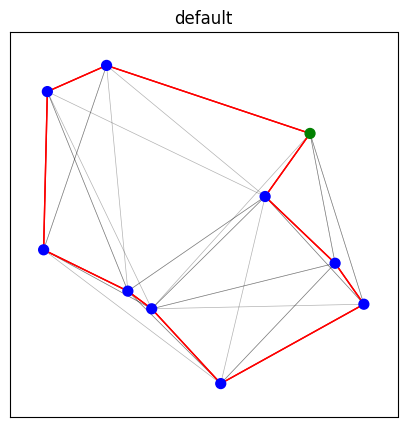

In [8]:
if notebook_mode:
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    batch_size = config.batch_size
    train_filepath = config.train_filepath
    dataset = GoogleTSPReader(num_nodes, num_neighbors, batch_size, train_filepath)
    print("Number of batches of size {}: {}".format(batch_size, dataset.max_iter))

    t = time.time()
    batch = next(iter(dataset))  # Generate a batch of TSPs
    print("Batch generation took: {:.3f} sec".format(time.time() - t))

    print("edges:", batch.edges.shape)
    print("edges_values:", batch.edges_values.shape)
    print("edges_targets:", batch.edges_target.shape)
    print("nodes:", batch.nodes.shape)
    print("nodes_target:", batch.nodes_target.shape)
    print("nodes_coord:", batch.nodes_coord.shape)
    print("tour_nodes:", batch.tour_nodes.shape)
    print("tour_len:", batch.tour_len.shape)

    idx = 0
    f = plt.figure(figsize=(5, 5))
    a = f.add_subplot(111)
    plot_tsp(a, batch.nodes_coord[idx], batch.edges[idx], batch.edges_values[idx], batch.edges_target[idx])
    print(batch.edges_target[idx])

In [9]:
# Uncomment below to automatically compute the number of nearest neighbors to use in k-NN input graph
# if config.num_neighbors == -1:
#     dataset = GoogleTSPReader(config.num_nodes, config.num_neighbors, config.batch_size, config.train_filepath)
#     config.num_neighbors = get_max_k(dataset, max_iter=10000//config.batch_size)
#     print(f"New num_neighbors for k-NN input: {config.num_neighbors}")

In [10]:
from models.model import MainModel

In [11]:
if notebook_mode == True:
    # Instantiate the network
    net = nn.DataParallel(MainModel(config))
    if torch.cuda.is_available():
        net.cuda()
    print(net)

    # Compute number of network parameters
    nb_param = 0
    for param in net.parameters():
        nb_param += np.prod(list(param.data.size()))
    print('Number of parameters:', nb_param)
    
    # Define optimizer
    learning_rate = config.learning_rate
    optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)
    print(optimizer)

DataParallel(
  (module): MainModel(
    (NodesEncoding): NodesEncodeur(
      (A1): Linear(in_features=2, out_features=50, bias=True)
    )
    (EdgesEncoding): EdgesEncodeur(
      (A2): Linear(in_features=1, out_features=25, bias=True)
      (A3): Linear(in_features=1, out_features=25, bias=True)
    )
    (gcn_layers): ModuleList(
      (0): HiddenLayer(
        (bnNodes): BatchNormNodes(
          (W1): Linear(in_features=50, out_features=50, bias=False)
          (W2): Linear(in_features=50, out_features=50, bias=False)
          (batch_norm): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        )
        (bnEdges): BatchNormEdges(
          (W3): Linear(in_features=50, out_features=50, bias=False)
          (W4): Linear(in_features=50, out_features=50, bias=False)
          (W5): Linear(in_features=50, out_features=50, bias=False)
          (batch_norm): BatchNorm2d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        )

Test forward pass

In [12]:
if notebook_mode == True and viz_mode == False:
    # Generate a batch of TSPs
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    batch_size = config.batch_size
    train_filepath = config.train_filepath
    dataset = iter(GoogleTSPReader(num_nodes, num_neighbors, batch_size, train_filepath))
    batch = next(dataset)

    # Convert batch to torch Variables
    edges_k_means = Variable(torch.LongTensor(batch.edges).type(dtypeFloat), requires_grad=False)
    edges_dist = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
    x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeFloat), requires_grad=False)
    nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
    y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeFloat), requires_grad=False)
    y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeFloat), requires_grad=False)
    
    # Compute class weights
    edge_labels = y_edges.cpu().numpy().flatten()
    edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
    print("Class weights: {}".format(edge_cw))
        
    # Forward pass
    y_preds, loss = net.forward(nodes_coord, edges_dist, edges_k_means, y_edges, edge_cw)

    # y_edges = y_edges.long()
    
    # edge_cw = torch.Tensor(edge_cw).type(dtypeFloat)  # Convert to tensors
    # loss = loss_edges(y_preds, y_edges, edge_cw)
    
    loss = loss.mean()
    print("Output size: {}".format(y_preds.size()))
    print("Loss value:", loss)

Class weights: [0.625 2.5  ]
Output size: torch.Size([3, 10, 10, 2])
Loss value: tensor(0.7583, grad_fn=<MeanBackward0>)


In [13]:
print(y_preds.shape)


torch.Size([3, 10, 10, 2])


Test backward pass

In [14]:
torch.autograd.set_detect_anomaly(True)

if notebook_mode == True and viz_mode == False:
    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    # Optimizer step
    optimizer.step()
    
    # Compute error metrics 
    err_edges, err_tour, err_tsp, tour_err_idx, tsp_err_idx = edge_error(y_preds, y_edges, edges_k_means)
    print("Edge error: {:.3f}\nTour error: {:.3f}\nTSP error: {:.3f}".format(err_edges, err_tour, err_tsp))
    
    # Compute mean predicted and groundtruth tour length
    pred_tour_len = mean_tour_len_edges(edges_dist, y_preds)
    gt_tour_len = np.mean(batch.tour_len) 
    print("Predicted tour length: {:.3f}\nGroundtruth tour length: {:.3f}".format(pred_tour_len, gt_tour_len))

Edge error: 25.714
Tour error: 91.667
TSP error: 94.809
Predicted tour length: 2.371
Groundtruth tour length: 2.653


In [15]:
def train_one_epoch(net, optimizer, config, master_bar):
    # Set training mode
    net.train()

    # Assign parameters
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    batch_size = config.batch_size
    batches_per_epoch = config.batches_per_epoch
    accumulation_steps = config.accumulation_steps
    train_filepath = config.train_filepath

    # Load TSP data
    dataset = GoogleTSPReader(num_nodes, num_neighbors, batch_size, train_filepath)
    if batches_per_epoch != -1:
        batches_per_epoch = min(batches_per_epoch, dataset.max_iter)
    else:
        batches_per_epoch = dataset.max_iter

    # Convert dataset to iterable
    dataset = iter(dataset)
    
    # Initially set loss class weights as None
    edge_cw = None

    # Initialize running data
    running_loss = 0.0
    # running_err_edges = 0.0
    # running_err_tour = 0.0
    # running_err_tsp = 0.0
    running_pred_tour_len = 0.0
    running_gt_tour_len = 0.0
    running_nb_data = 0
    running_nb_batch = 0

    start_epoch = time.time()
    for batch_num in progress_bar(range(batches_per_epoch), parent=master_bar):
        # Generate a batch of TSPs
        try:
            batch = next(dataset)
        except StopIteration:
            break

        # Convert batch to torch Variables
        edges_k_means = Variable(torch.LongTensor(batch.edges).type(dtypeFloat), requires_grad=False)
        edges_dist = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
        x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeFloat), requires_grad=False)
        nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
        y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeFloat), requires_grad=False)
        y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeFloat), requires_grad=False)
        
        # Compute class weights (if uncomputed)
        if type(edge_cw) != torch.Tensor:
            edge_labels = y_edges.cpu().numpy().flatten()
            edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
        
        # Forward pass
        y_preds, loss = net.forward(nodes_coord, edges_dist, edges_k_means, y_edges, edge_cw)
        loss = loss.mean()  # Take mean of loss across multiple GPUs
        loss = loss / accumulation_steps  # Scale loss by accumulation steps
        loss.backward()
            

        # Backward pass
        if (batch_num+1) % accumulation_steps == 0:
            optimizer.step()
            optimizer.zero_grad()

        # Compute error metrics and mean tour lengths
        # err_edges, err_tour, err_tsp, tour_err_idx, tsp_err_idx = edge_error(y_preds, y_edges, x_edges)
        pred_tour_len = mean_tour_len_edges(edges_dist, y_preds)
        gt_tour_len = np.mean(batch.tour_len)

        # Update running data
        running_nb_data += batch_size
        running_loss += batch_size* loss.data.item()* accumulation_steps  # Re-scale loss
        # running_err_edges += batch_size* err_edges
        # running_err_tour += batch_size* err_tour
        # running_err_tsp += batch_size* err_tsp
        running_pred_tour_len += batch_size* pred_tour_len
        running_gt_tour_len += batch_size* gt_tour_len
        running_nb_batch += 1
        
        # Log intermediate statistics
        result = ('loss:{loss:.4f} pred_tour_len:{pred_tour_len:.3f} gt_tour_len:{gt_tour_len:.3f}'.format(
            loss=running_loss/running_nb_data,
            pred_tour_len=running_pred_tour_len/running_nb_data,
            gt_tour_len=running_gt_tour_len/running_nb_data))
        master_bar.child.comment = result

    # Compute statistics for full epoch
    loss = running_loss/ running_nb_data
    err_edges = 0 # running_err_edges/ running_nb_data
    err_tour = 0 # running_err_tour/ running_nb_data
    err_tsp = 0 # running_err_tsp/ running_nb_data
    pred_tour_len = running_pred_tour_len/ running_nb_data
    gt_tour_len = running_gt_tour_len/ running_nb_data

    return time.time()-start_epoch, loss, err_edges, err_tour, err_tsp, pred_tour_len, gt_tour_len


def metrics_to_str(epoch, time, learning_rate, loss, err_edges, err_tour, err_tsp, pred_tour_len, gt_tour_len):
    result = ( 'epoch:{epoch:0>2d}\t'
               'time:{time:.1f}h\t'
               'lr:{learning_rate:.2e}\t'
               'loss:{loss:.4f}\t'
               # 'err_edges:{err_edges:.2f}\t'
               # 'err_tour:{err_tour:.2f}\t'
               # 'err_tsp:{err_tsp:.2f}\t'
               'pred_tour_len:{pred_tour_len:.3f}\t'
               'gt_tour_len:{gt_tour_len:.3f}'.format(
                   epoch=epoch,
                   time=time/3600,
                   learning_rate=learning_rate,
                   loss=loss,
                   # err_edges=err_edges,
                   # err_tour=err_tour,
                   # err_tsp=err_tsp,
                   pred_tour_len=pred_tour_len,
                   gt_tour_len=gt_tour_len))
    return result

In [16]:
if notebook_mode==True and viz_mode==False:
    epoch_bar = master_bar(range(1))
    for epoch in epoch_bar:
        # Validation
        val_time, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len = train_one_epoch(net, optimizer, config, epoch_bar)
        epoch_bar.write('v: ' + metrics_to_str(epoch, val_time, learning_rate, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len))



Evaluation Loop (for validation and test sets)

In [17]:
def test(net, config, master_bar, mode='test'):
    # Set evaluation mode
    net.eval()

    # Assign parameters
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    batch_size = config.batch_size
    batches_per_epoch = config.batches_per_epoch
    beam_size = config.beam_size
    val_filepath = config.val_filepath
    test_filepath = config.test_filepath

    # Load TSP data
    if mode == 'val':
        dataset = GoogleTSPReader(num_nodes, num_neighbors, batch_size=batch_size, filepath=val_filepath)
    elif mode == 'test':
        dataset = GoogleTSPReader(num_nodes, num_neighbors, batch_size=batch_size, filepath=test_filepath)
    batches_per_epoch = dataset.max_iter

    # Convert dataset to iterable
    dataset = iter(dataset)
    
    # Initially set loss class weights as None
    edge_cw = None

    # Initialize running data
    running_loss = 0.0
    # running_err_edges = 0.0
    # running_err_tour = 0.0
    # running_err_tsp = 0.0
    running_pred_tour_len = 0.0
    running_gt_tour_len = 0.0
    running_nb_data = 0
    running_nb_batch = 0
    
    with torch.no_grad():
        start_test = time.time()
        for batch_num in progress_bar(range(batches_per_epoch), parent=master_bar):
            # Generate a batch of TSPs
            try:
                batch = next(dataset)
            except StopIteration:
                break

            # Convert batch to torch Variables
            edges_k_means = Variable(torch.LongTensor(batch.edges).type(dtypeFloat), requires_grad=False)
            edges_dist = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
            x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeFloat), requires_grad=False)
            nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
            y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeFloat), requires_grad=False)
            y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeFloat), requires_grad=False)
            
            # Compute class weights (if uncomputed)
            if type(edge_cw) != torch.Tensor:
                edge_labels = y_edges.cpu().numpy().flatten()
                edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
            
            # Forward pass
            y_preds, loss = net.forward(nodes_coord, edges_dist, edges_k_means, y_edges, edge_cw)
            loss = loss.mean()  # Take mean of loss across multiple GPUs

            # Compute error metrics
            # err_edges, err_tour, err_tsp, tour_err_idx, tsp_err_idx = edge_error(y_preds, y_edges, x_edges)

            # Get batch beamsearch tour prediction
            if mode == 'val':  # Validation: faster 'vanilla' beamsearch
                bs_nodes = beamsearch_tour_nodes(
                    y_preds, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')
            elif mode == 'test':  # Testing: beamsearch with shortest tour heuristic 
                bs_nodes = beamsearch_tour_nodes_shortest(
                    y_preds, edges_dist, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')
            elif mode == 'greedy':  # Validation: faster 'vanilla' beamsearch
                bs_nodes = beamsearch_tour_nodes(
                    y_preds, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')
            
            # Compute mean tour length
            pred_tour_len = mean_tour_len_nodes(edges_dist, bs_nodes)
            gt_tour_len = np.mean(batch.tour_len)

            # Update running data
            running_nb_data += batch_size
            running_loss += batch_size* loss.data.item()
            # running_err_edges += batch_size* err_edges
            # running_err_tour += batch_size* err_tour
            # running_err_tsp += batch_size* err_tsp
            running_pred_tour_len += batch_size* pred_tour_len
            running_gt_tour_len += batch_size* gt_tour_len
            running_nb_batch += 1

            # Log intermediate statistics
            result = ('loss:{loss:.4f} pred_tour_len:{pred_tour_len:.3f} gt_tour_len:{gt_tour_len:.3f}'.format(
                loss=running_loss/running_nb_data,
                pred_tour_len=running_pred_tour_len/running_nb_data,
                gt_tour_len=running_gt_tour_len/running_nb_data))
            master_bar.child.comment = result

    # Compute statistics for full epoch
    loss = running_loss/ running_nb_data
    err_edges = 0 # running_err_edges/ running_nb_data
    err_tour = 0 # running_err_tour/ running_nb_data
    err_tsp = 0 # running_err_tsp/ running_nb_data
    pred_tour_len = running_pred_tour_len/ running_nb_data
    gt_tour_len = running_gt_tour_len/ running_nb_data

    return time.time()-start_test, loss, err_edges, err_tour, err_tsp, pred_tour_len, gt_tour_len

In [18]:
if notebook_mode==True and viz_mode==False:
    epoch_bar = master_bar(range(1))
    for epoch in epoch_bar:
        # Validation
        val_time, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len = test(net, config, epoch_bar, mode='val')
        epoch_bar.write('v: ' + metrics_to_str(epoch, val_time, learning_rate, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len))
        # Testing
        test_time, test_loss, test_err_edges, test_err_tour, test_err_tsp, test_pred_tour_len, test_gt_tour_len = test(net, config, epoch_bar, mode='test')
        epoch_bar.write('T: ' + metrics_to_str(epoch, test_time, learning_rate, test_loss, test_err_edges, test_err_tour, test_err_tsp, test_pred_tour_len, test_gt_tour_len))

In [19]:
from models.model import MainModel

In [20]:
def main(config):
    # Instantiate the network
    net = nn.DataParallel(MainModel(config))
    if torch.cuda.is_available():
        net.cuda()
    print(net)

    # Compute number of network parameters
    nb_param = 0
    for param in net.parameters():
        nb_param += np.prod(list(param.data.size()))
    print('Number of parameters:', nb_param)
 
    # Create log directory
    log_dir = f"./logs/{config.expt_name}/"
    os.makedirs(log_dir, exist_ok=True)
    json.dump(config, open(f"{log_dir}/config.json", "w"), indent=4)
    writer = SummaryWriter(log_dir)  # Define Tensorboard writer

    # Training parameters
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    max_epochs = config.max_epochs
    val_every = config.val_every
    test_every = config.test_every
    batch_size = config.batch_size
    batches_per_epoch = config.batches_per_epoch
    accumulation_steps = config.accumulation_steps
    learning_rate = config.learning_rate
    decay_rate = config.decay_rate
    val_loss_old = 1e6  # For decaying LR based on validation loss
    best_pred_tour_len = 1e6  # For saving checkpoints

    # Define optimizer
    optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)
    print(optimizer)

    epoch_bar = master_bar(range(max_epochs))
    for epoch in epoch_bar:
        print('hey, new epoch')
        # Log to Tensorboard
        writer.add_scalar('learning_rate', learning_rate, epoch)
        
        # Train
        train_time, train_loss, train_err_edges, train_err_tour, train_err_tsp, train_pred_tour_len, train_gt_tour_len = train_one_epoch(net, optimizer, config, epoch_bar)
        print('train_one_epoch done')
        epoch_bar.write('t: ' + metrics_to_str(epoch, train_time, learning_rate, train_loss, train_err_edges, train_err_tour, train_err_tsp, train_pred_tour_len, train_gt_tour_len))
        writer.add_scalar('loss/train_loss', train_loss, epoch)
        writer.add_scalar('pred_tour_len/train_pred_tour_len', train_pred_tour_len, epoch)
        writer.add_scalar('optimality_gap/train_opt_gap', train_pred_tour_len/train_gt_tour_len - 1, epoch)
        print('writer added')

        if epoch % val_every == 0 or epoch == max_epochs-1:
            # Validate
            print('in validate, going to test, mode = val')
            val_time, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len = test(net, config, epoch_bar, mode='val')
            epoch_bar.write('v: ' + metrics_to_str(epoch, val_time, learning_rate, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len))
            writer.add_scalar('loss/val_loss', val_loss, epoch)
            writer.add_scalar('pred_tour_len/val_pred_tour_len', val_pred_tour_len, epoch)
            writer.add_scalar('optimality_gap/val_opt_gap', val_pred_tour_len/val_gt_tour_len - 1, epoch)
            
            # Save checkpoint
            if val_pred_tour_len < best_pred_tour_len:
                best_pred_tour_len = val_pred_tour_len  # Update best prediction
                torch.save({
                    'epoch': epoch,
                    'model_state_dict': net.state_dict(),
                    'optimizer_state_dict': optimizer.state_dict(),
                    'train_loss': train_loss,
                    'val_loss': val_loss,
                }, log_dir+"best_val_checkpoint.tar")
            
            # Update learning rate
            if val_loss > 0.99 * val_loss_old:
                learning_rate /= decay_rate
                optimizer = update_learning_rate(optimizer, learning_rate)
            
            val_loss_old = val_loss  # Update old validation loss

        if epoch % test_every == 0 or epoch == max_epochs-1:
            # Test
            test_time, test_loss, test_err_edges, test_err_tour, test_err_tsp, test_pred_tour_len, test_gt_tour_len = test(net, config, epoch_bar, mode='test')
            epoch_bar.write('T: ' + metrics_to_str(epoch, test_time, learning_rate, test_loss, test_err_edges, test_err_tour, test_err_tsp, test_pred_tour_len, test_gt_tour_len))
            writer.add_scalar('loss/test_loss', test_loss, epoch)
            writer.add_scalar('pred_tour_len/test_pred_tour_len', test_pred_tour_len, epoch)
            writer.add_scalar('optimality_gap/test_opt_gap', test_pred_tour_len/test_gt_tour_len - 1, epoch)
        
        # Save training checkpoint at the end of epoch
        torch.save({
            'epoch': epoch,
            'model_state_dict': net.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
        }, log_dir+"last_train_checkpoint.tar")
        
        # Save checkpoint after every 250 epochs
        if epoch != 0 and (epoch % 250 == 0 or epoch == max_epochs-1):
            torch.save({
                'epoch': epoch,
                'model_state_dict': net.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'train_loss': train_loss,
                'val_loss': val_loss,
            }, log_dir+f"checkpoint_epoch{epoch}.tar")
        
    return net

In [21]:
if viz_mode==False:
    # del net
    net = main(config)

DataParallel(
  (module): MainModel(
    (NodesEncoding): NodesEncodeur(
      (A1): Linear(in_features=2, out_features=50, bias=True)
    )
    (EdgesEncoding): EdgesEncodeur(
      (A2): Linear(in_features=1, out_features=25, bias=True)
      (A3): Linear(in_features=1, out_features=25, bias=True)
    )
    (gcn_layers): ModuleList(
      (0): HiddenLayer(
        (bnNodes): BatchNormNodes(
          (W1): Linear(in_features=50, out_features=50, bias=False)
          (W2): Linear(in_features=50, out_features=50, bias=False)
          (batch_norm): BatchNorm1d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        )
        (bnEdges): BatchNormEdges(
          (W3): Linear(in_features=50, out_features=50, bias=False)
          (W4): Linear(in_features=50, out_features=50, bias=False)
          (W5): Linear(in_features=50, out_features=50, bias=False)
          (batch_norm): BatchNorm2d(50, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        )

hey, new epoch
train_one_epoch done
writer added
in validate, going to test, mode = val
hey, new epoch
train_one_epoch done
writer added
in validate, going to test, mode = val


In [22]:
if notebook_mode==True:
    # Load checkpoint
    log_dir = f"./logs/{config.expt_name}/"
    if torch.cuda.is_available():
        checkpoint = torch.load(log_dir+"best_val_checkpoint.tar")
    else:
        checkpoint = torch.load(log_dir+"best_val_checkpoint.tar", map_location='cpu')
    # Load network state
    net.load_state_dict(checkpoint['model_state_dict'])
    # Load optimizer state
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    # Load other training parameters
    epoch = checkpoint['epoch']
    train_loss = checkpoint['train_loss']
    val_loss = checkpoint['val_loss']
    for param_group in optimizer.param_groups:
        learning_rate = param_group['lr']
    print(f"Loaded checkpoint from epoch {epoch}") 

Loaded checkpoint from epoch 0


Predicted tour length: 0.000 (mean)
Groundtruth tour length: 2.958 (mean)
0  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
1  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
2  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
3  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
4  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
5  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
6  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
7  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
8  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
9  Invalid tour:  tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])


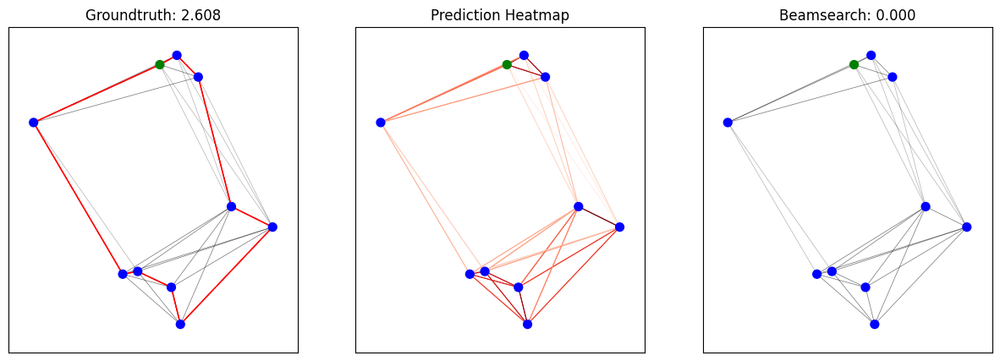

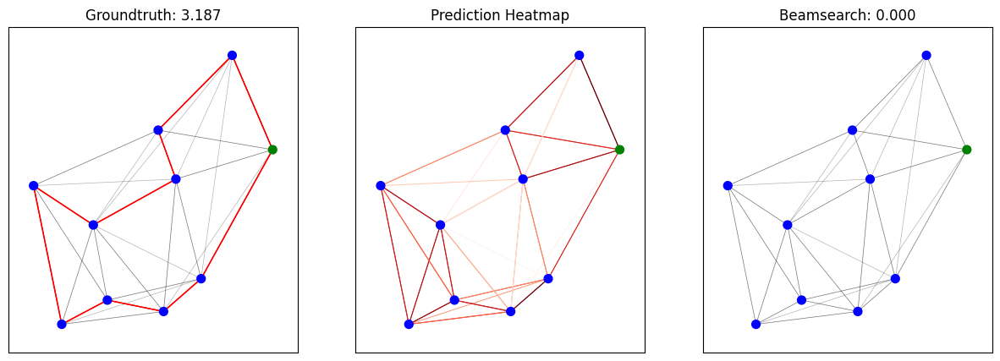

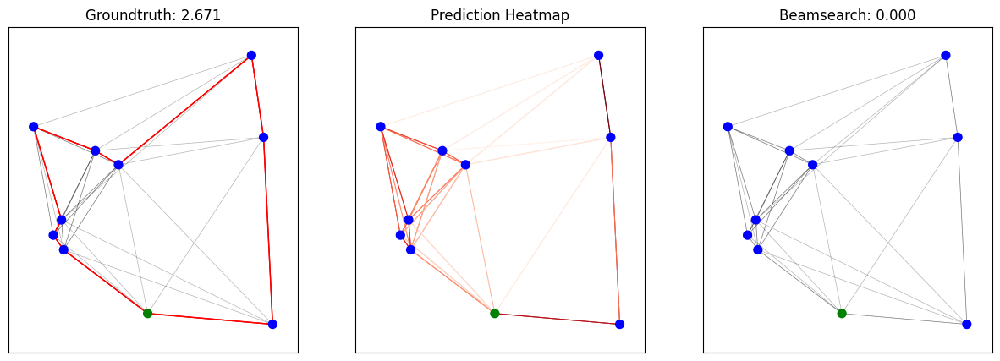

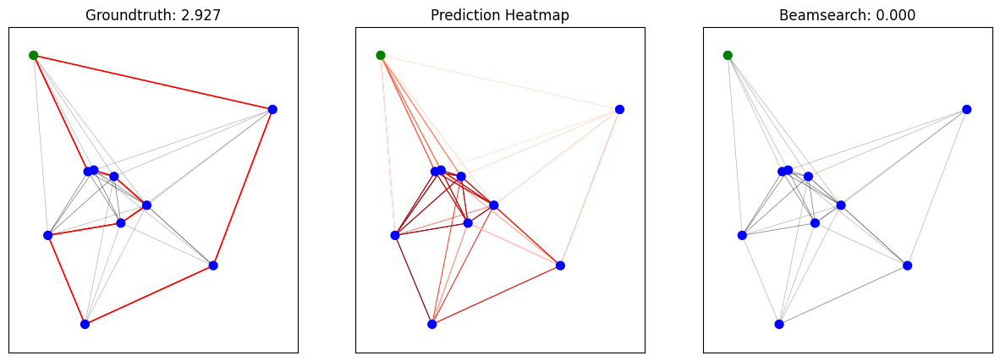

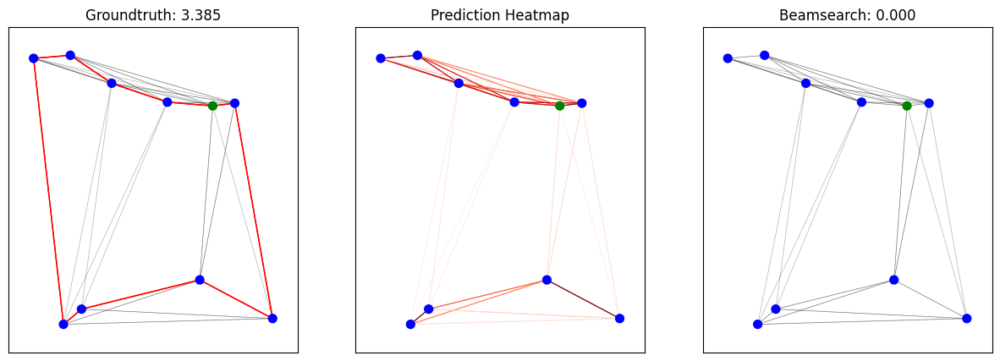

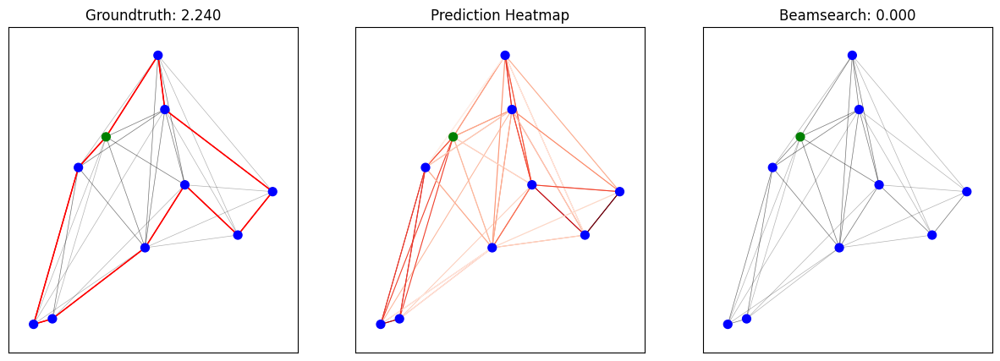

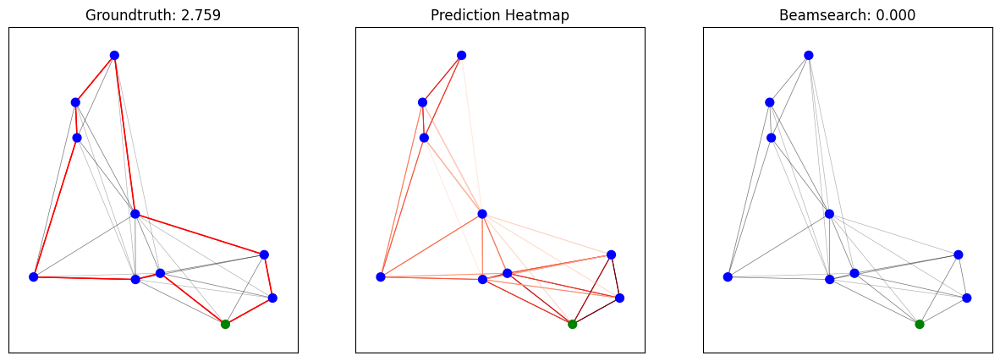

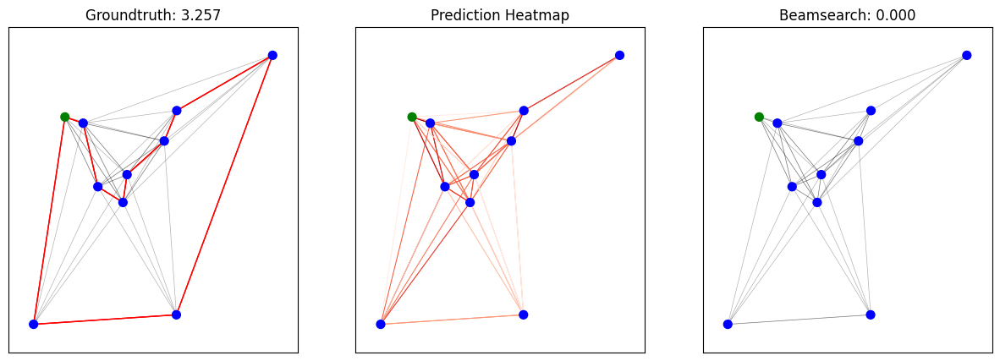

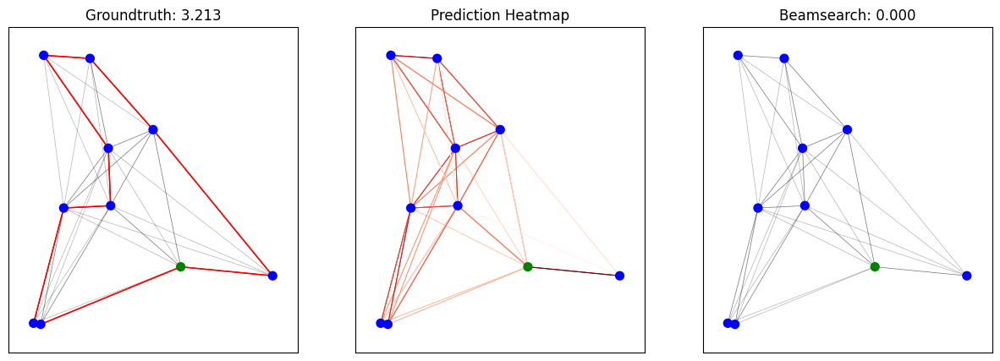

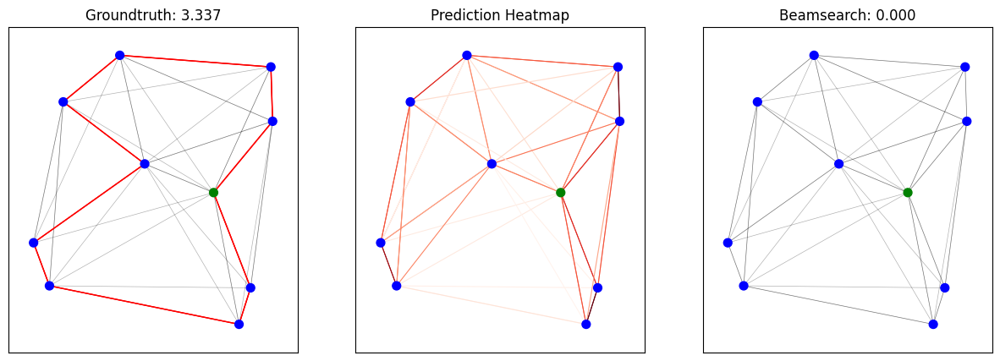

In [ ]:
if notebook_mode==True:
    # Set evaluation mode
    net.eval()
    
    batch_size = 10
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    beam_size = config.beam_size
    test_filepath = config.test_filepath
    dataset = iter(GoogleTSPReader(num_nodes, num_neighbors, batch_size, test_filepath))
    batch = next(dataset)

    with torch.no_grad():
        # Convert batch to torch Variables

        edges_k_means = Variable(torch.LongTensor(batch.edges).type(dtypeFloat), requires_grad=False)
        edges_dist = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
        x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeFloat), requires_grad=False)
        nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
        y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeFloat), requires_grad=False)
        y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeFloat), requires_grad=False)
        
        # Compute class weights (if uncomputed)
        if type(edge_cw) != torch.Tensor:
            edge_labels = y_edges.cpu().numpy().flatten()
            edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
        
        # Forward pass
        y_preds, loss = net.forward(nodes_coord, edges_dist, edges_k_means, y_edges, edge_cw)
        loss = loss.mean()
        
        # Get batch beamsearch tour prediction
        bs_nodes = beamsearch_tour_nodes_shortest(
            y_preds, edges_dist, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')
        #bs_nodes = beamsearch_tour_nodes(
        #    y_preds, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')

        # Compute mean tour length
        pred_tour_len = mean_tour_len_nodes(edges_dist, bs_nodes)
        gt_tour_len = np.mean(batch.tour_len)
        print("Predicted tour length: {:.3f} (mean)\nGroundtruth tour length: {:.3f} (mean)".format(pred_tour_len, gt_tour_len))

        # Sanity check
        for idx, nodes in enumerate(bs_nodes):
            if not is_valid_tour(nodes, num_nodes):
                print(idx, " Invalid tour: ", nodes)

        # Plot prediction visualizations
        plot_predictions_beamsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, bs_nodes, num_plots=batch_size)

In [ ]:
if notebook_mode==True:
    epoch_bar = master_bar(range(epoch+1, epoch+2))
    config.batch_size = 200
    for epoch in epoch_bar:
        # Set validation dataset as the test dataset so that we can perform 
        # greedy and vanilla beam search on test data without hassle!
        config.val_filepath = config.test_filepath
        
        # Greedy search
        config.beam_size = 1
        t=time.time()
        val_time, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len = test(net, config, epoch_bar, mode='val')
        print("G time: {}s".format(time.time()-t))
        epoch_bar.write('G: ' + metrics_to_str(epoch, val_time, learning_rate, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len))
        
        # Vanilla beam search
        config.beam_size = 1280
        t=time.time()
        val_time, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len = test(net, config, epoch_bar, mode='val')
        print("BS time: {}s".format(time.time()-t))
        epoch_bar.write('BS: ' + metrics_to_str(epoch, val_time, learning_rate, val_loss, val_err_edges, val_err_tour, val_err_tsp, val_pred_tour_len, val_gt_tour_len))
        
        # Beam search with shortest tour heuristic
        config.beam_size = 1280
        t=time.time()
        test_time, test_loss, test_err_edges, test_err_tour, test_err_tsp, test_pred_tour_len, test_gt_tour_len = test(net, config, epoch_bar, mode='test')
        print("BS* time: {}s".format(time.time()-t))
        epoch_bar.write('BS*: ' + metrics_to_str(epoch, test_time, learning_rate, test_loss, test_err_edges, test_err_tour, test_err_tsp, test_pred_tour_len, test_gt_tour_len))

G time: 4.874458074569702s
BS time: 44.55342483520508s
BS* time: 253.9209339618683s


TEST

In [15]:
net = torch.load("simple_net_model.pth")

In [54]:
from utils.UCB import UCBTreeSearch, plot_predictions_UCBsearch, UCBSearch_with_batch

In [55]:
from utils.UCB2 import UCBSearch_with_batch_UCB2
from utils.bs import beamSearch_with_batch


begin
tensor([[[0.0000, 0.5213, 0.5005, 1.0165, 0.4348, 0.3901, 0.7667, 0.7062,
          0.8145, 1.0175],
         [0.5213, 0.0000, 0.6190, 0.8445, 0.0875, 0.7917, 0.5509, 0.8427,
          0.9420, 0.9862],
         [0.5005, 0.6190, 0.0000, 0.5646, 0.5585, 0.3583, 0.4057, 0.2340,
          0.3423, 0.5183],
         [1.0165, 0.8445, 0.5646, 0.0000, 0.8417, 0.9144, 0.2944, 0.5285,
          0.5228, 0.2756],
         [0.4348, 0.0875, 0.5585, 0.8417, 0.0000, 0.7087, 0.5477, 0.7877,
          0.8905, 0.9603],
         [0.3901, 0.7917, 0.3583, 0.9144, 0.7087, 0.0000, 0.7583, 0.4443,
          0.5324, 0.8120],
         [0.7667, 0.5509, 0.4057, 0.2944, 0.5477, 0.7583, 0.0000, 0.4995,
          0.5537, 0.4661],
         [0.7062, 0.8427, 0.2340, 0.5285, 0.7877, 0.4443, 0.4995, 0.0000,
          0.1101, 0.3710],
         [0.8145, 0.9420, 0.3423, 0.5228, 0.8905, 0.5324, 0.5537, 0.1101,
          0.0000, 0.3144],
         [1.0175, 0.9862, 0.5183, 0.2756, 0.9603, 0.8120, 0.4661, 0.3710,
          0

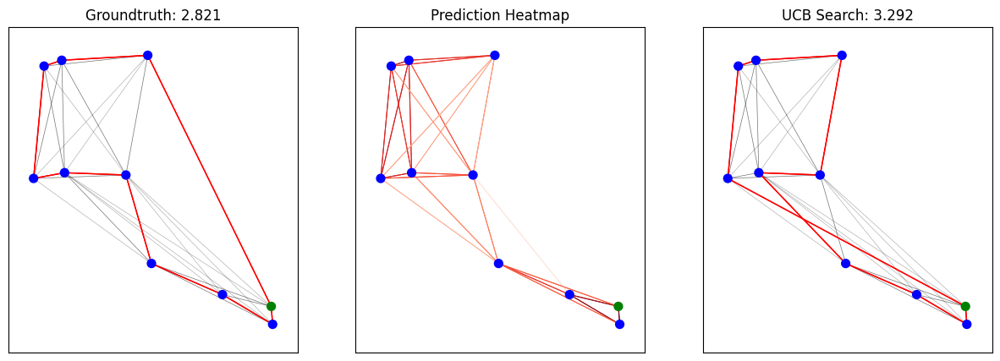

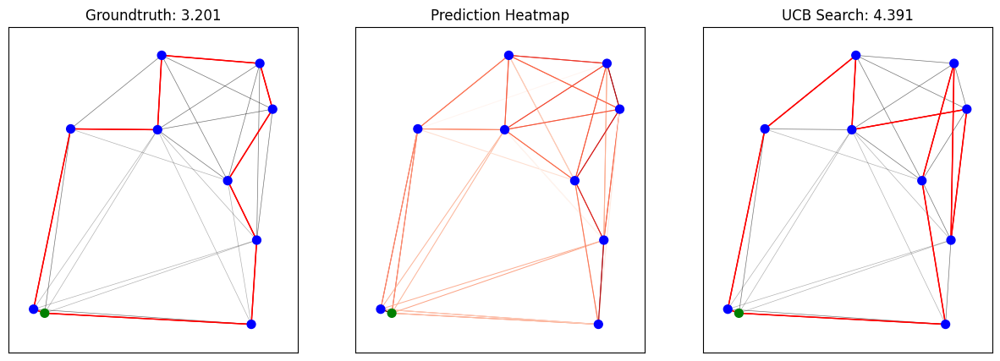

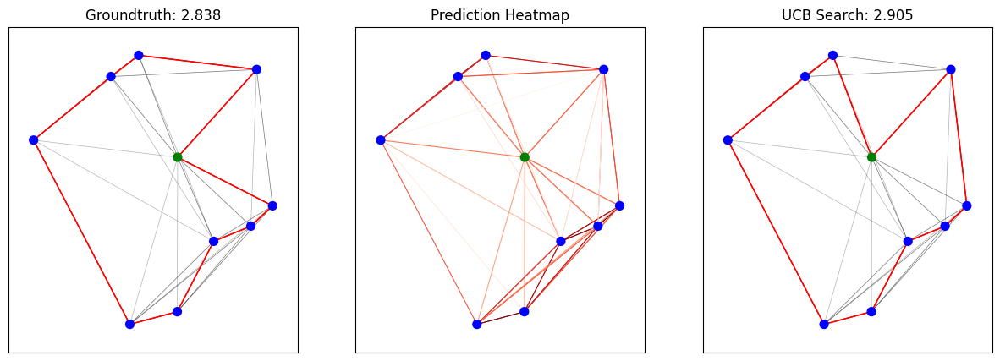

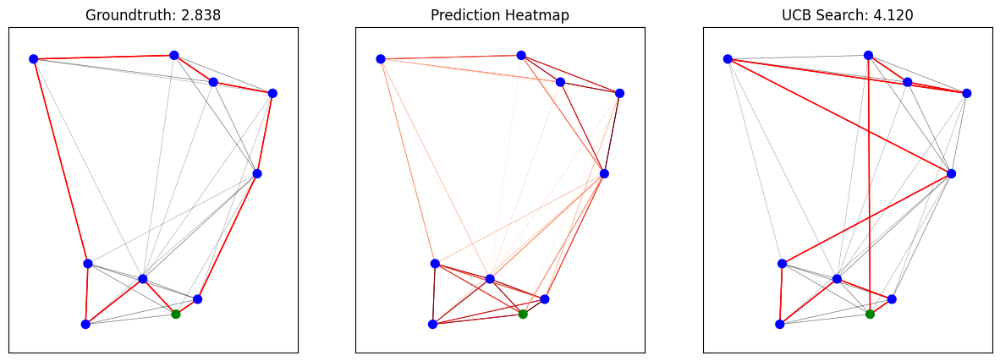

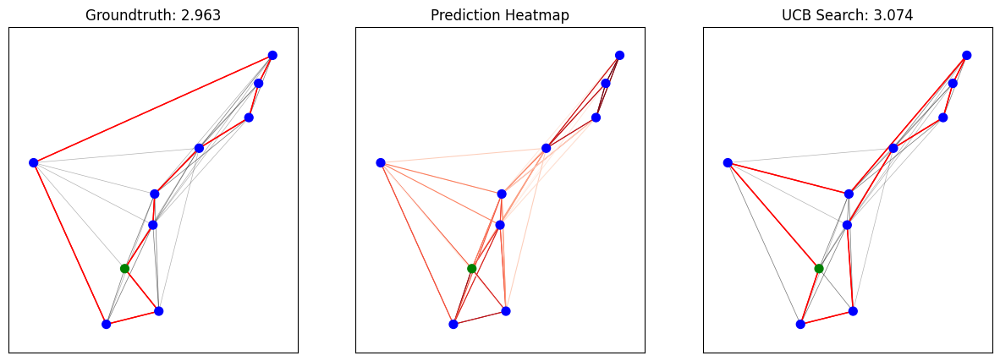

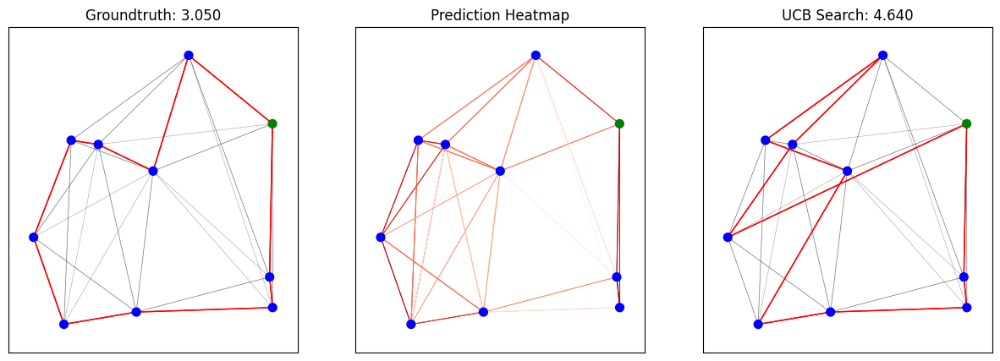

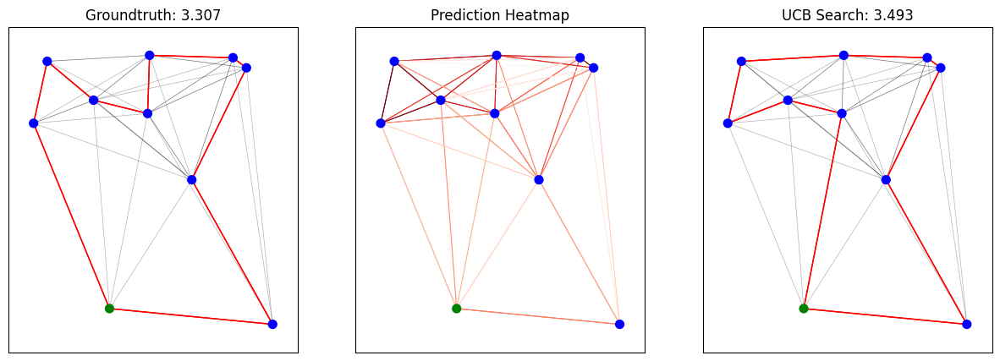

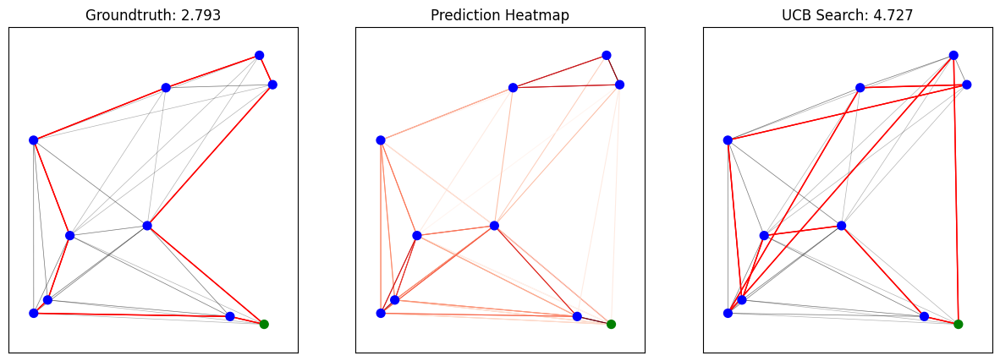

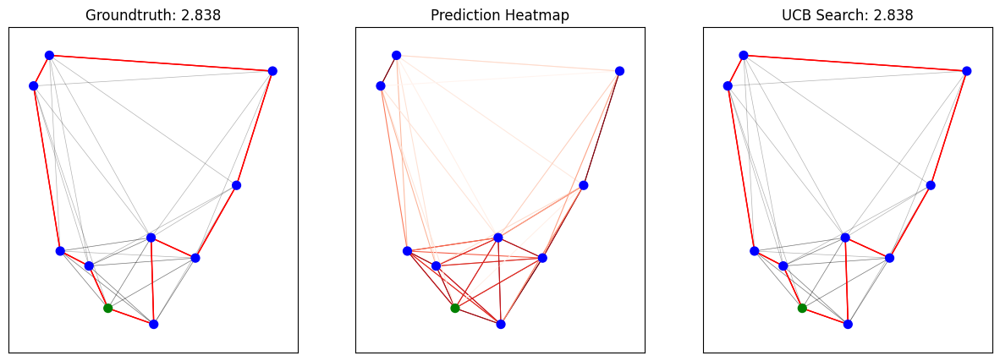

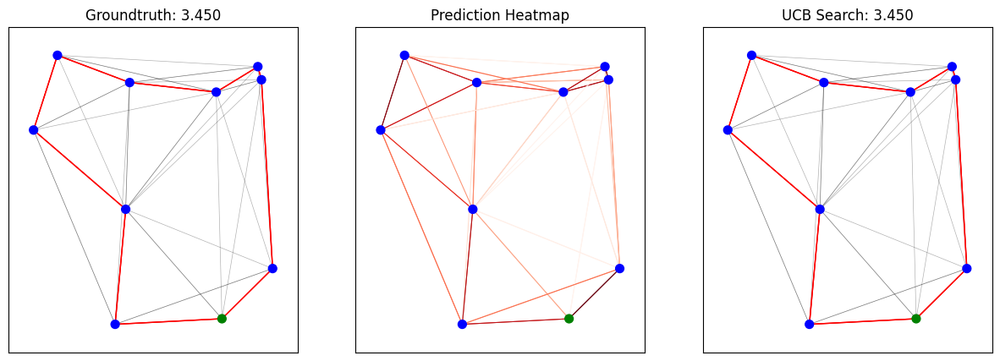

And UCB2


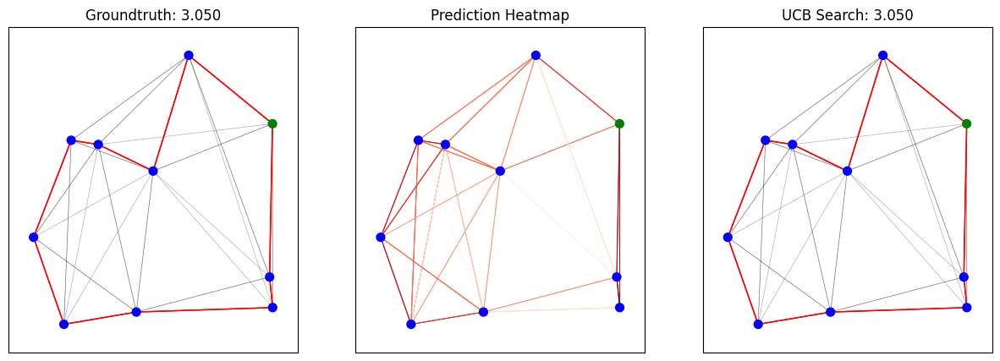

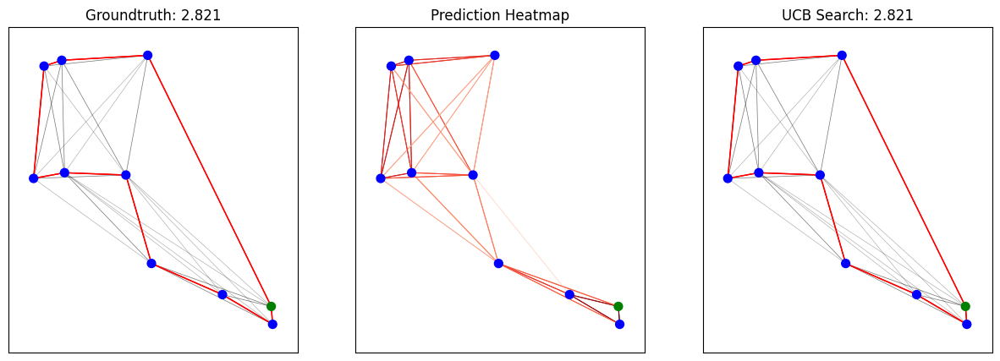

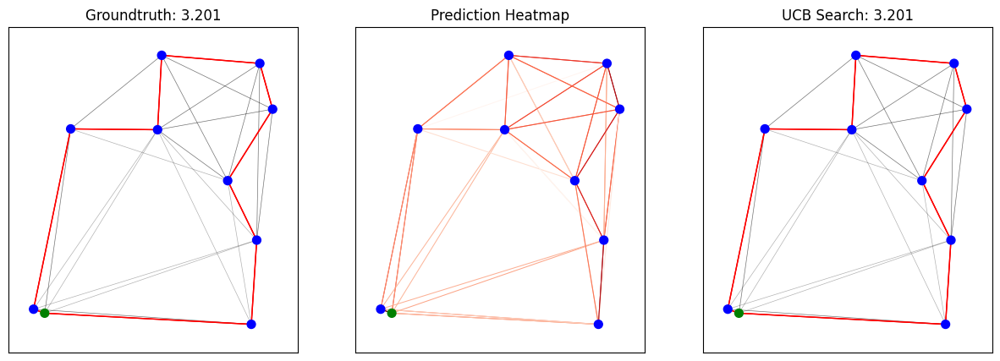

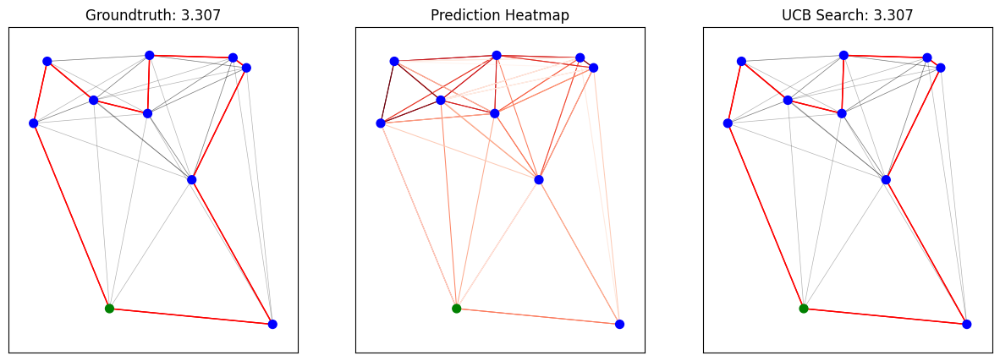

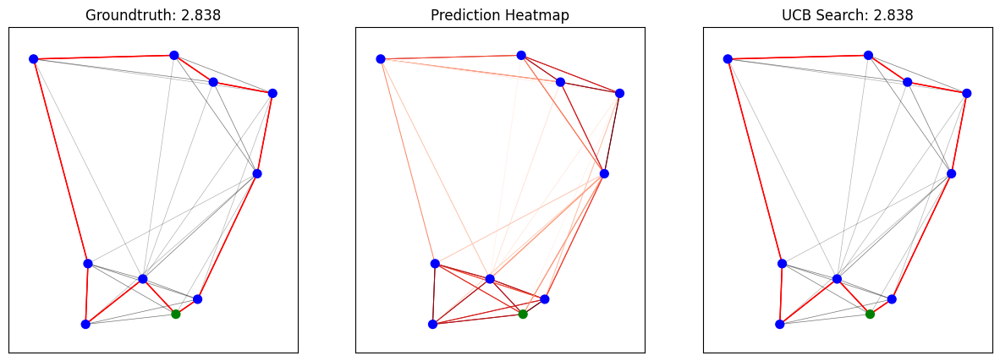

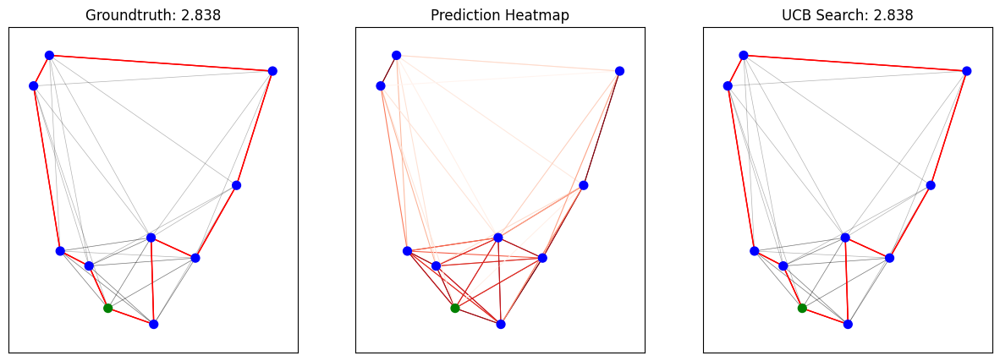

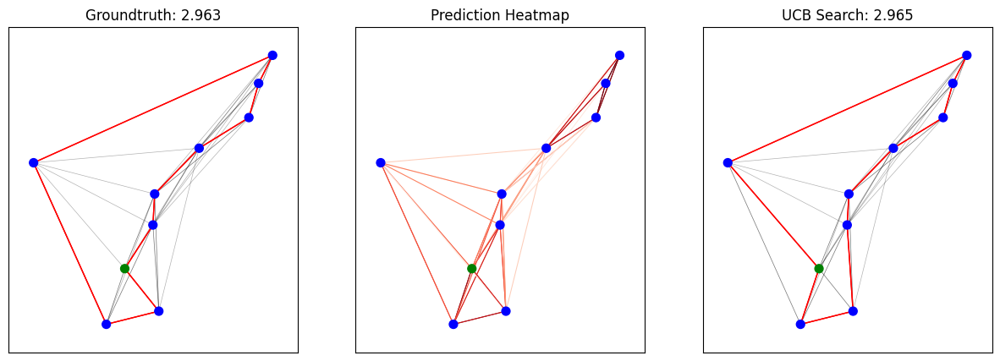

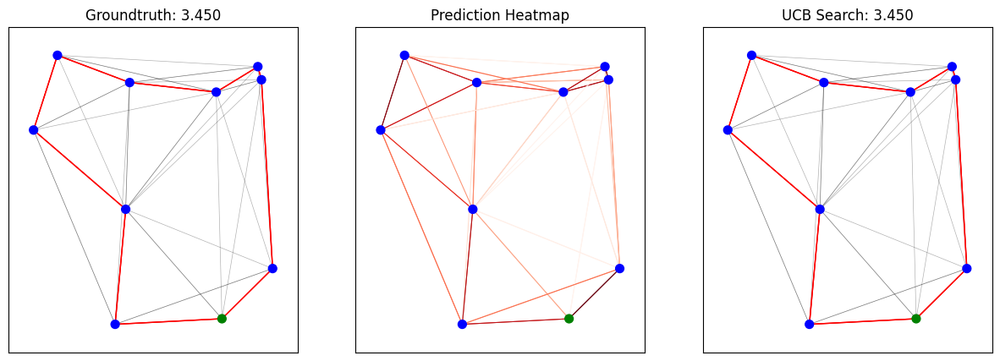

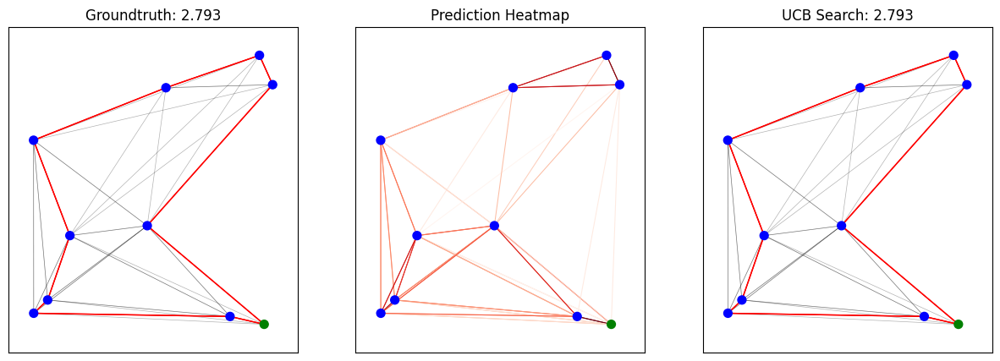

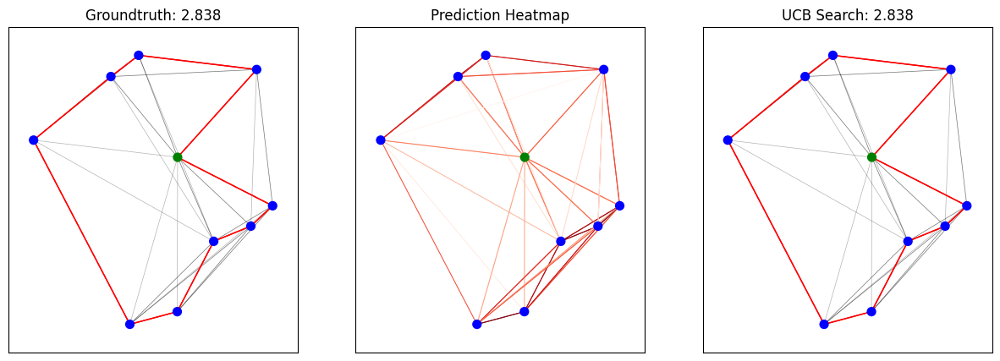

And BeamSearch


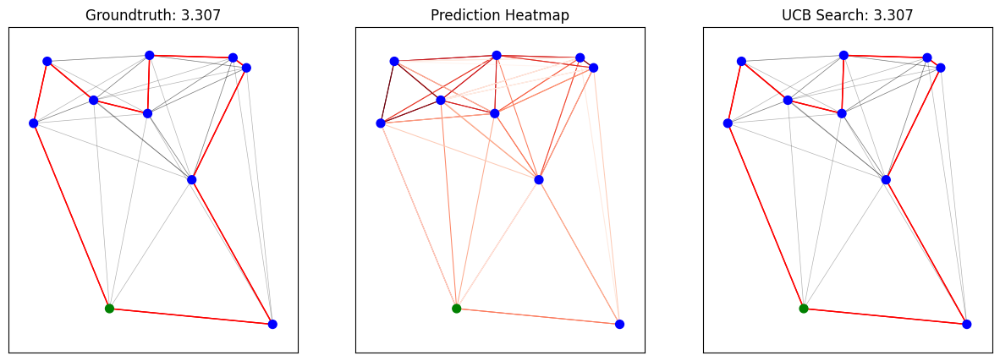

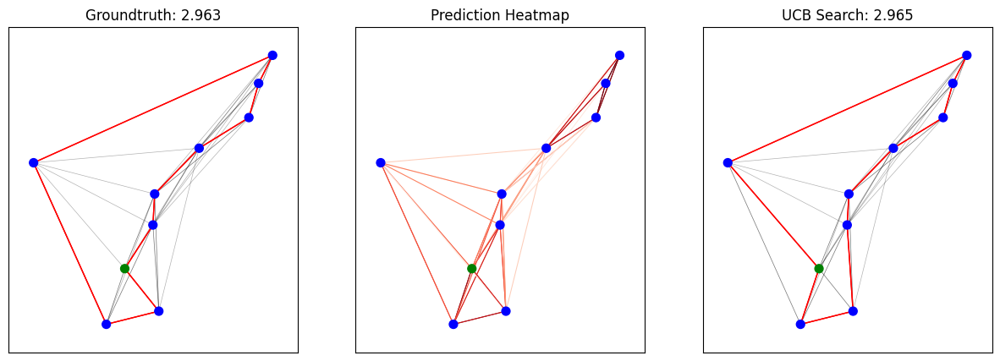

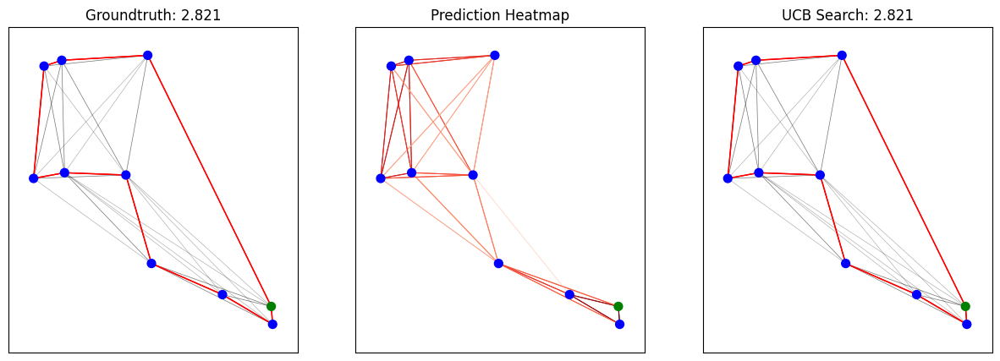

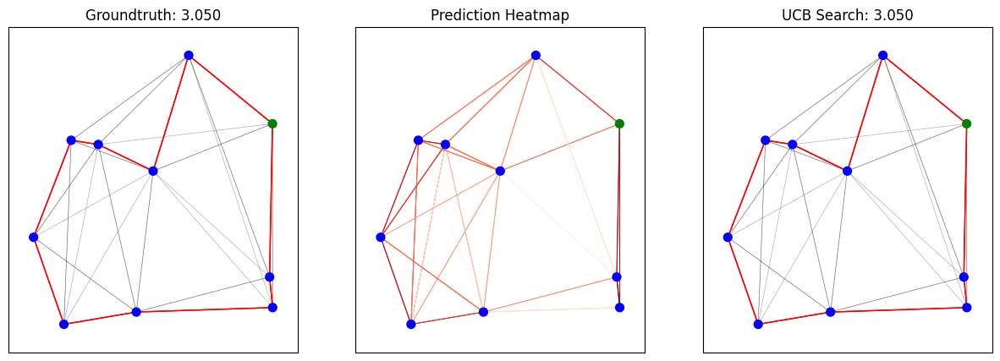

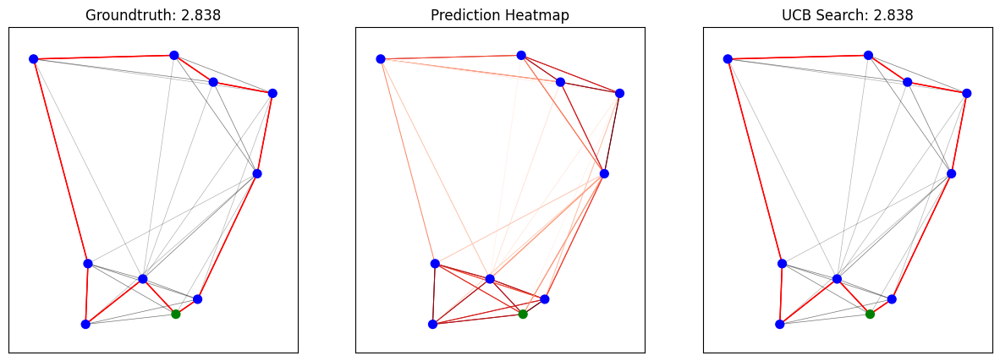

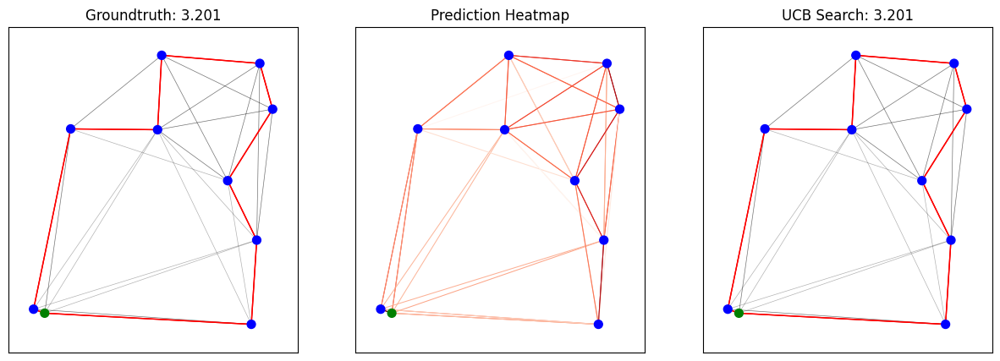

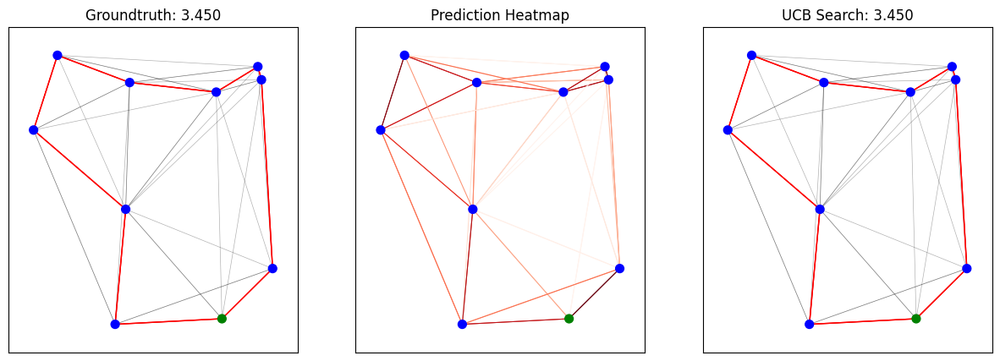

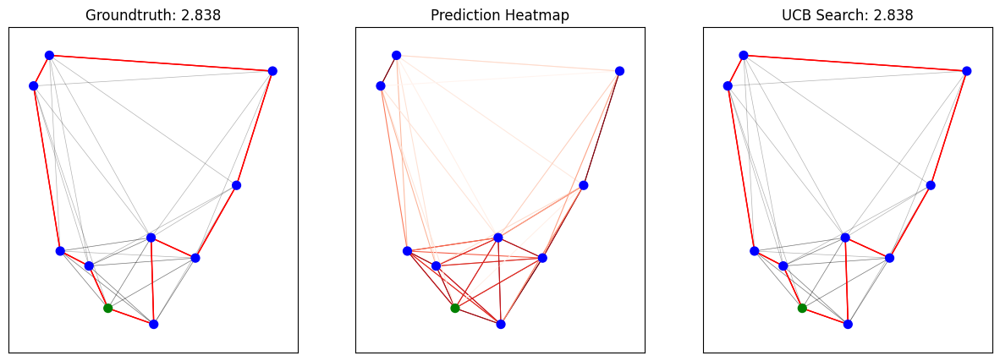

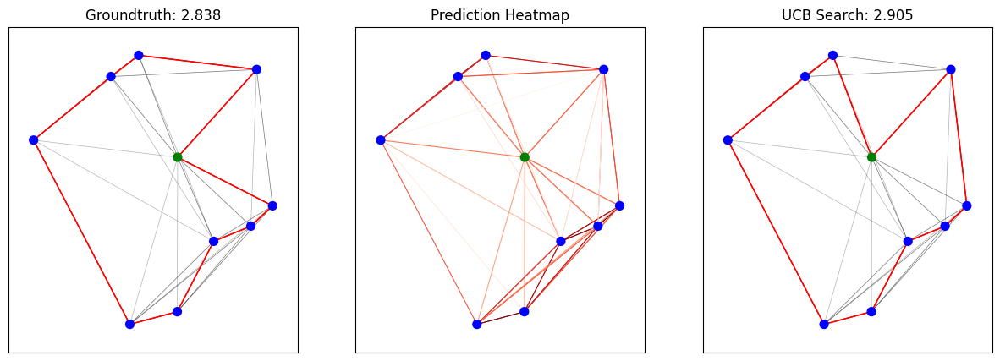

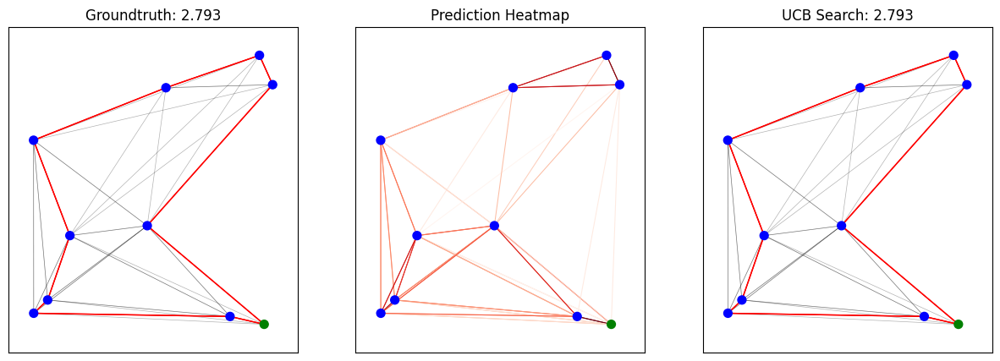

In [56]:
if notebook_mode==True:
    # Set evaluation mode
    net.eval()
    
    batch_size = 10
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    beam_size = config.beam_size
    test_filepath = config.test_filepath
    dataset = iter(GoogleTSPReader(num_nodes, num_neighbors, batch_size, test_filepath))
    batch = next(dataset)

    with torch.no_grad():
        # Convert batch to torch Variables

        edges_k_means = Variable(torch.LongTensor(batch.edges).type(dtypeFloat), requires_grad=False)
        edges_dist = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
        x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeFloat), requires_grad=False)
        nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
        y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeFloat), requires_grad=False)
        y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeFloat), requires_grad=False)
        
        # Compute class weights (if uncomputed)
        if type(edge_cw) != torch.Tensor:
            edge_labels = y_edges.cpu().numpy().flatten()
            edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
        
        # Forward pass
        y_preds, loss = net.forward(nodes_coord, edges_dist, edges_k_means, y_edges, edge_cw)
        
        y_UCB = 1- F.softmax(y_preds, dim=-1)
        
        y_UCB = y_UCB[:, :, :, 0]
        # TSP_UCB = UCBSearch_with_batch(y_UCB, edges_dist)
        TSP_UCB2 = UCBSearch_with_batch_UCB2(y_UCB, edges_dist)
        bs = beamSearch_with_batch(y_UCB, edges_dist)
            
        # plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
        # print("And UCB2")
        # plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)
        # print("And BeamSearch")
        # plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
        print("UCB2")
        plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)
        print("And BeamSearch")
        plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, bs, num_plots=batch_size)

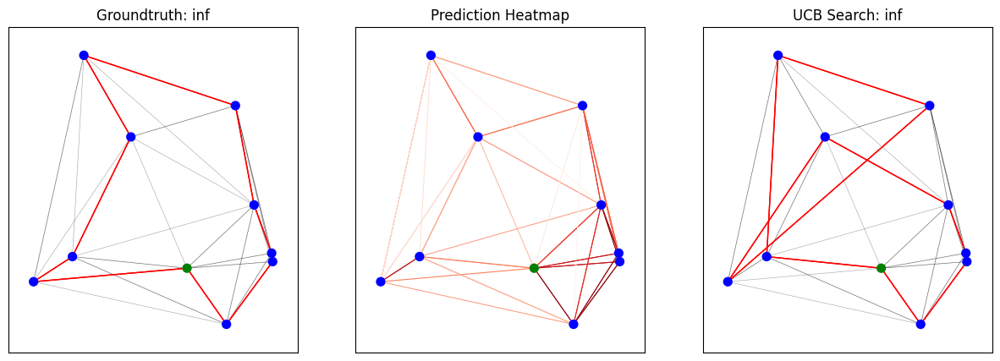

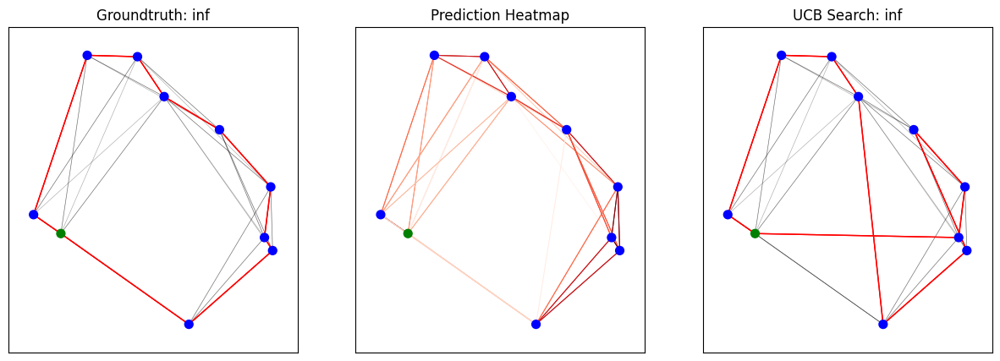

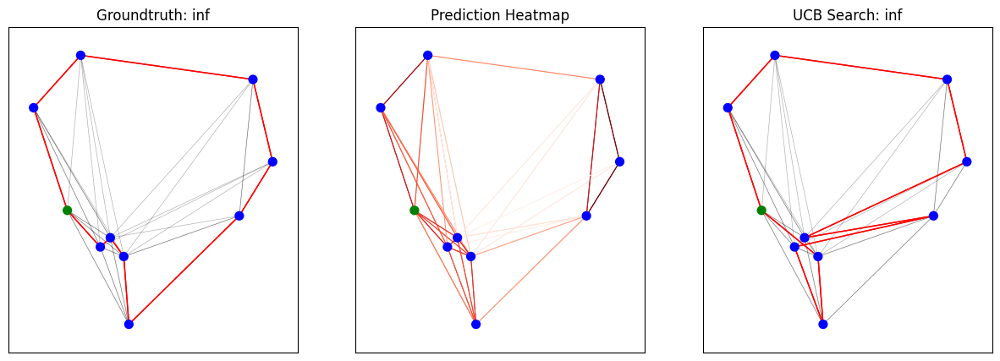

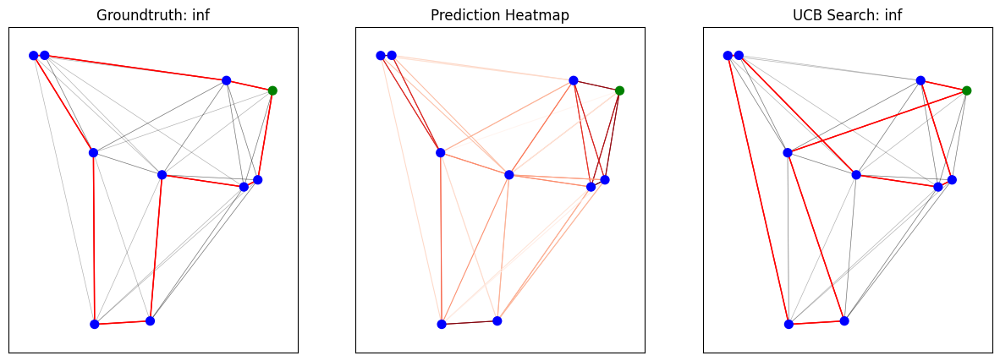

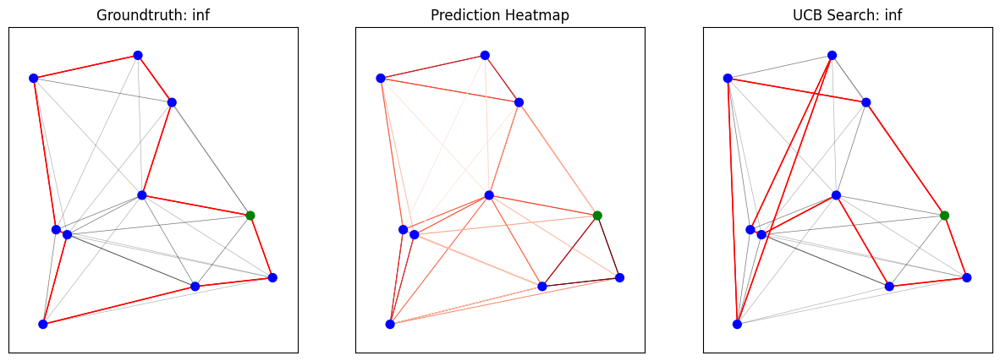

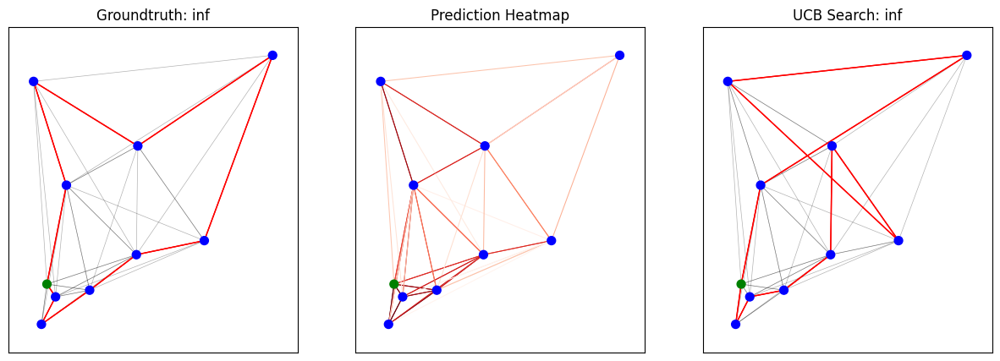

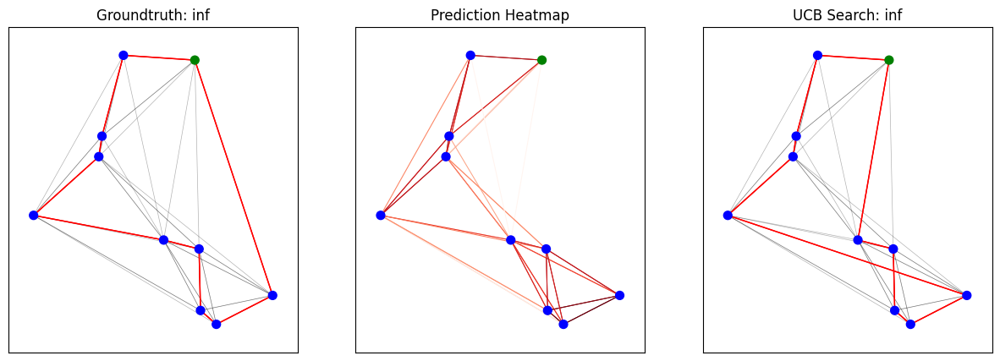

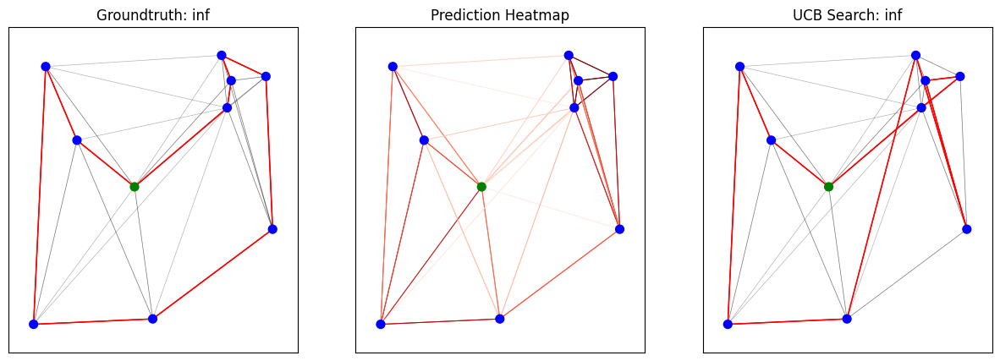

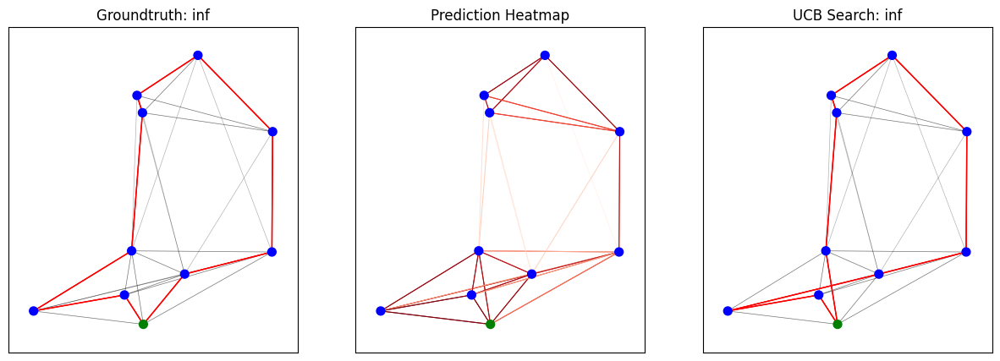

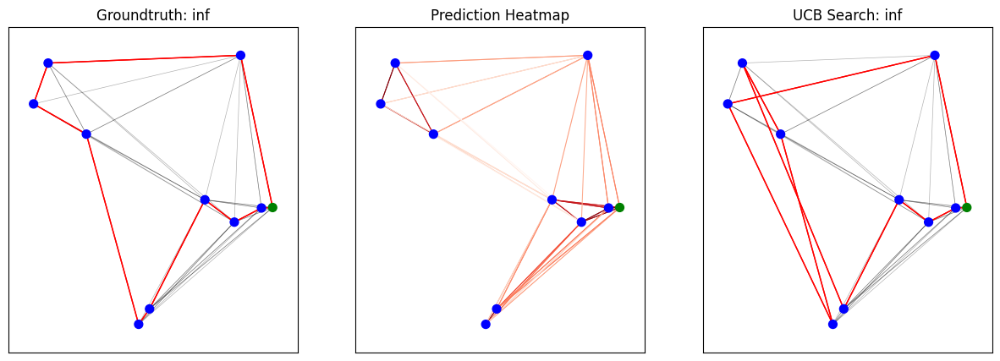

And UCB2


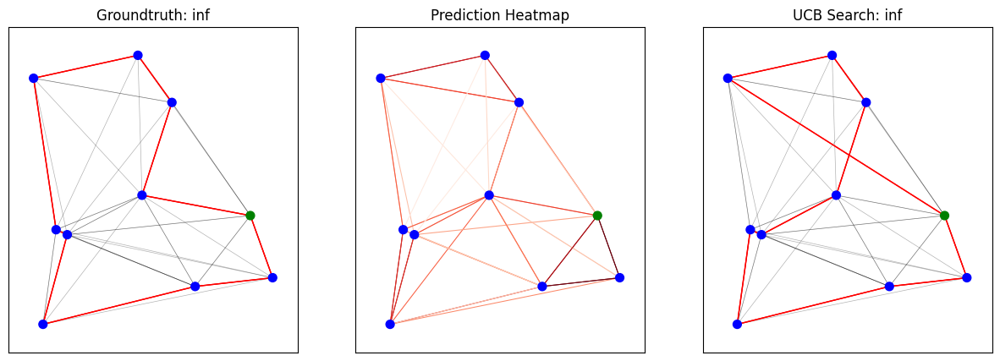

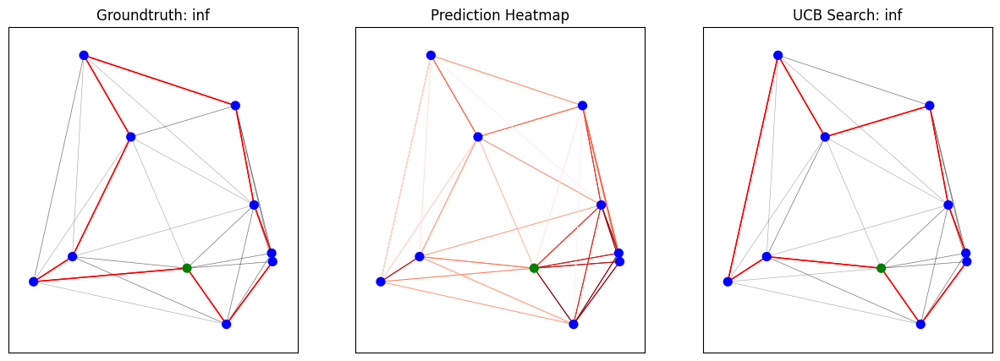

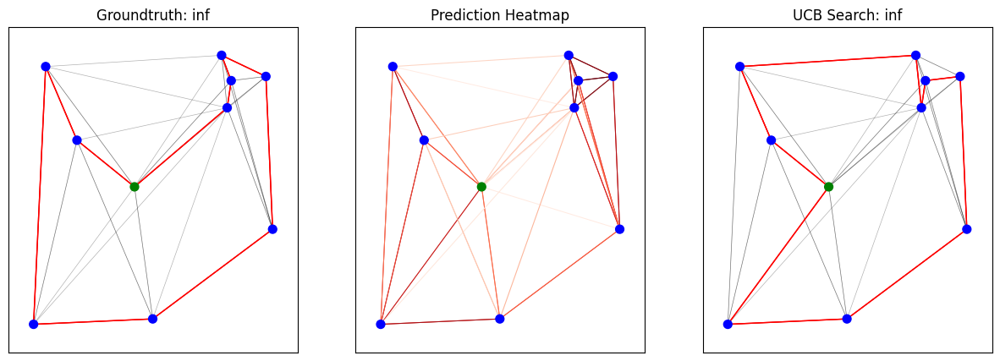

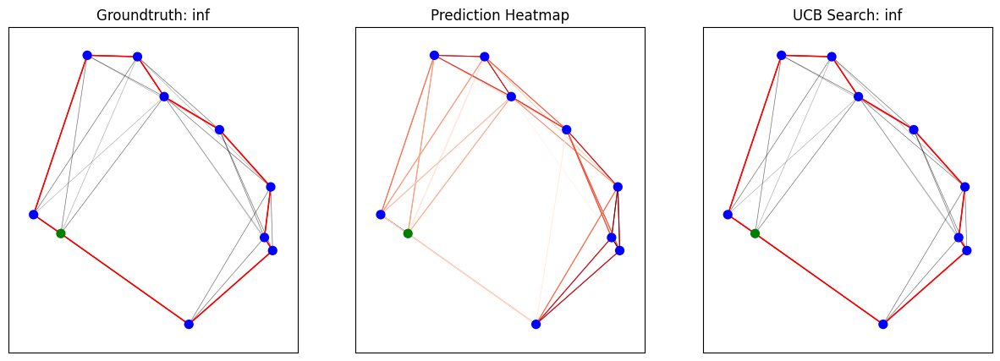

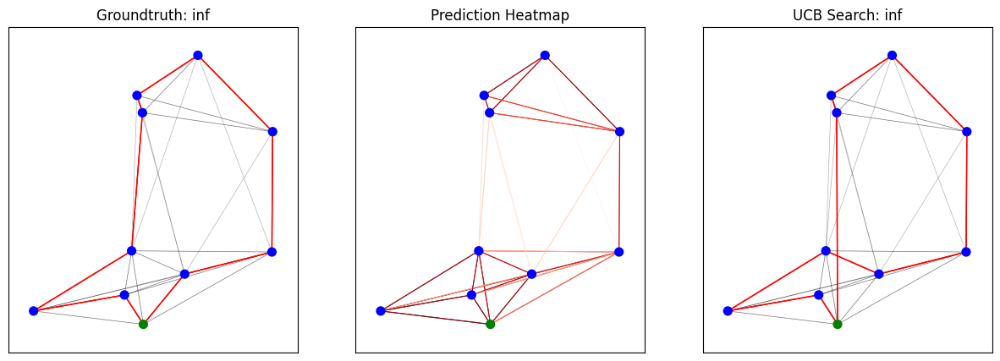

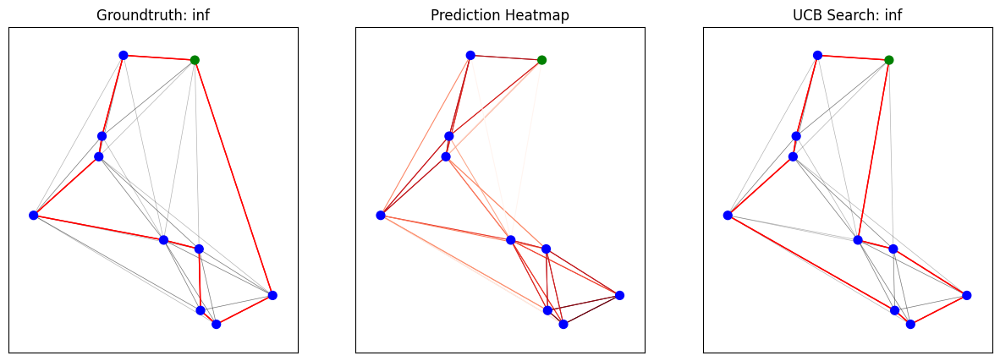

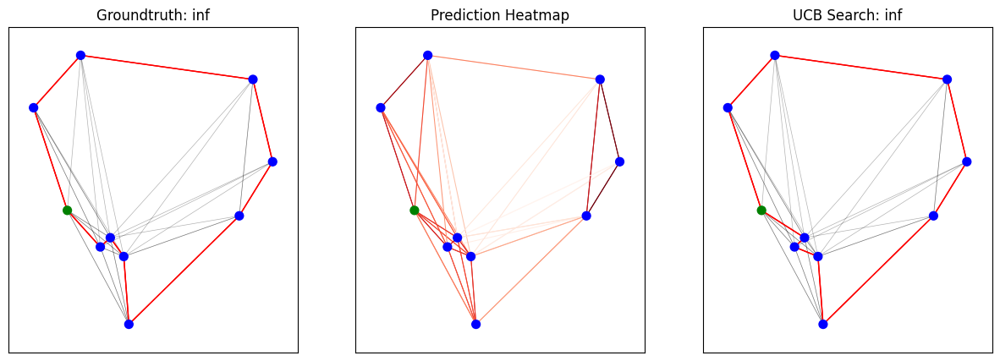

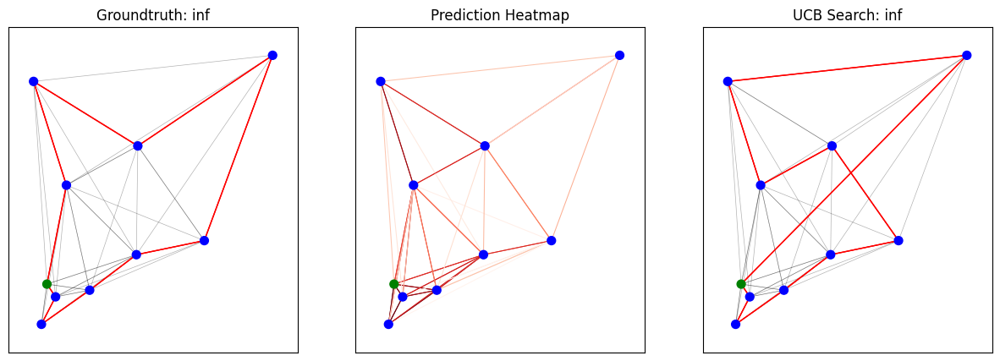

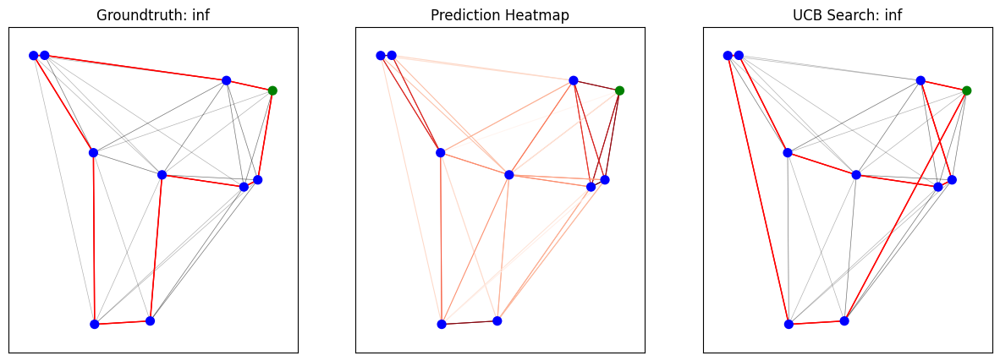

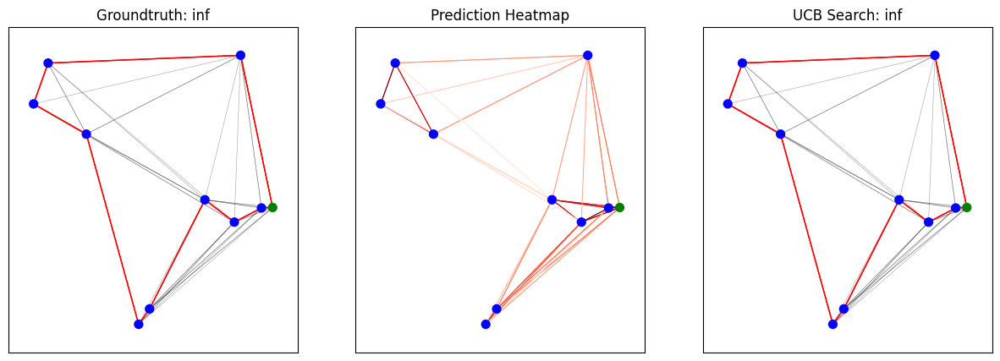

And BeamSearch


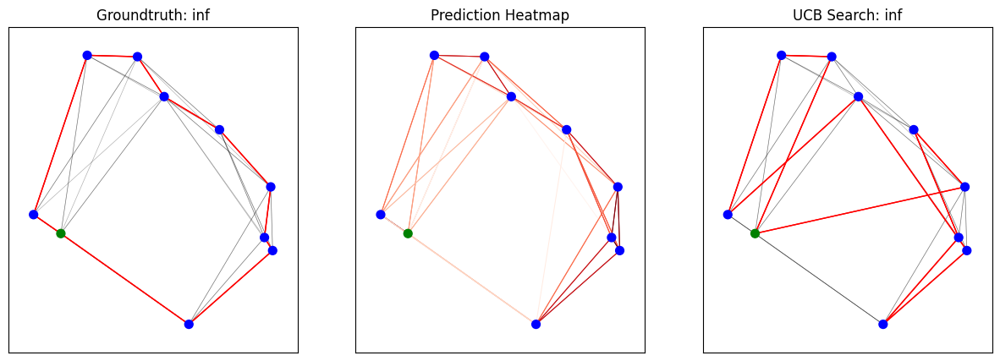

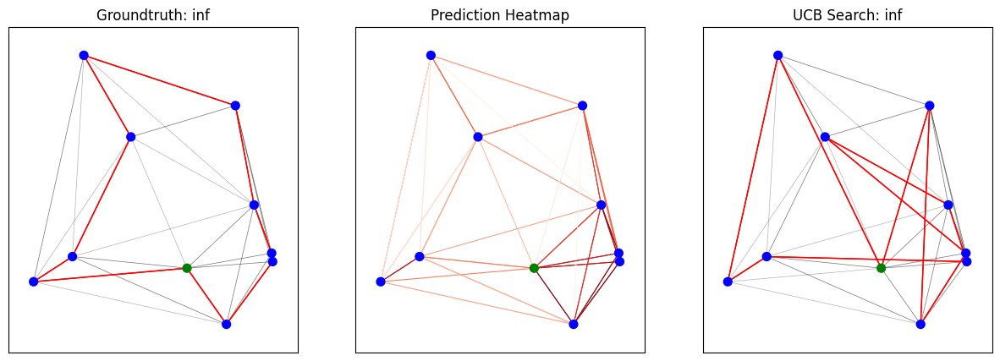

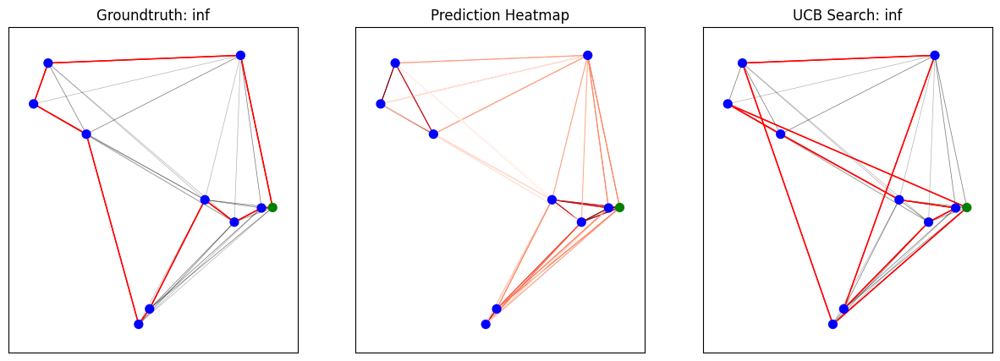

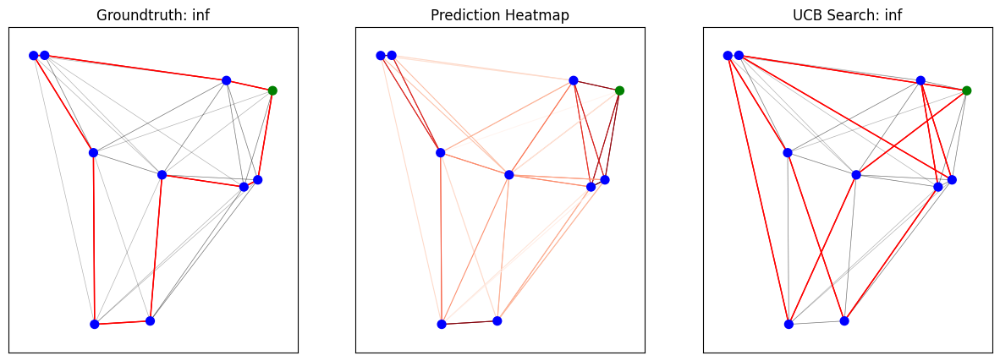

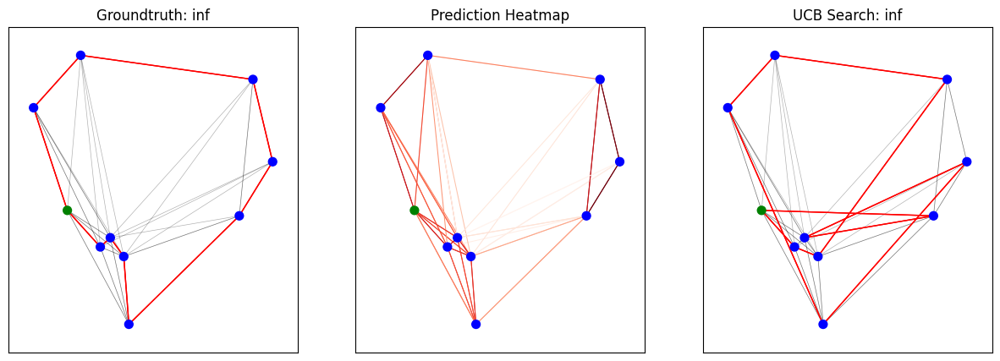

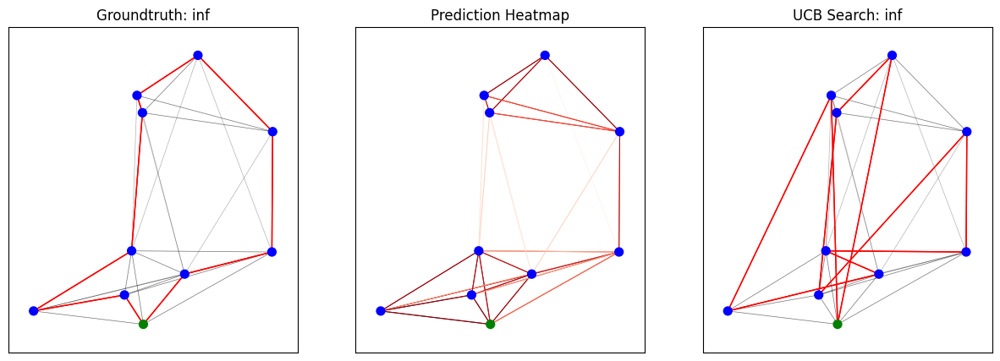

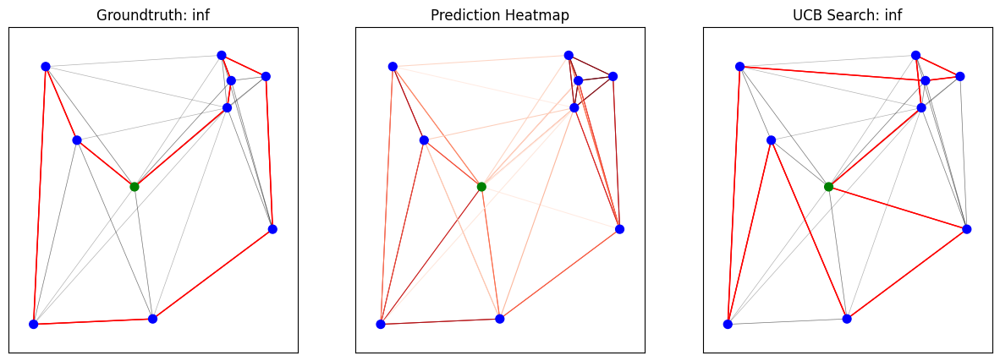

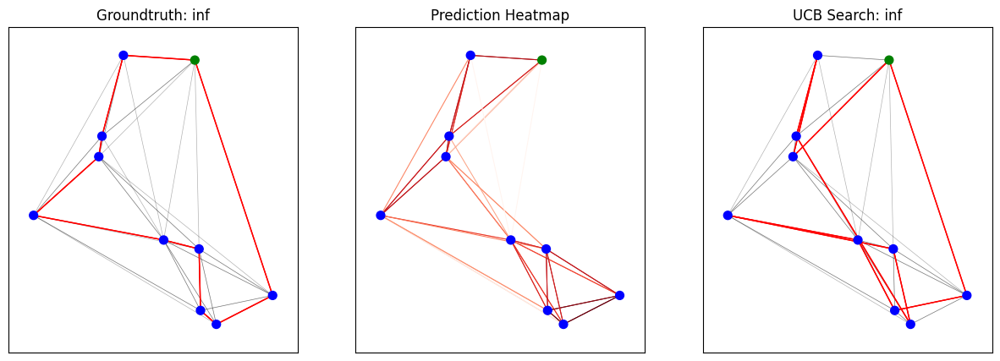

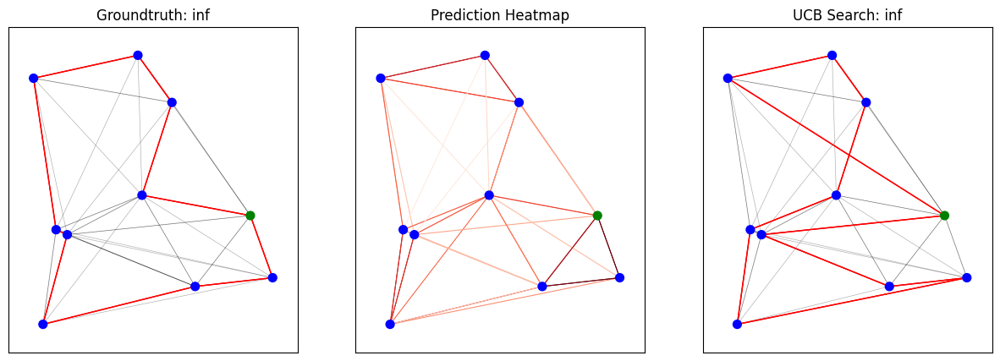

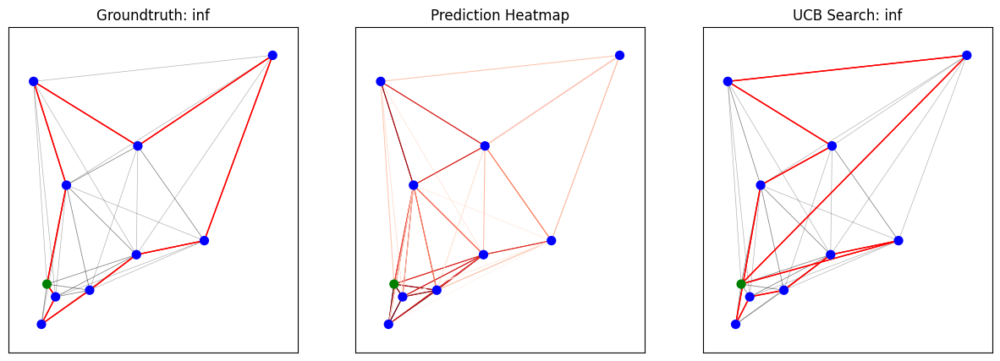

In [26]:
plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
print("And UCB2")
plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)
print("And BeamSearch")
plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, bs, num_plots=batch_size)

IndexError: arrays used as indices must be of integer (or boolean) type

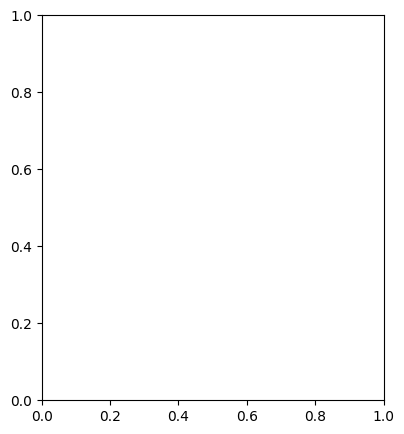

In [30]:
from utils.UCB import UCBTreeSearch, plot_predictions_UCBsearch, UCBSearch_with_batch
# plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
# print("And UCB2")
plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)

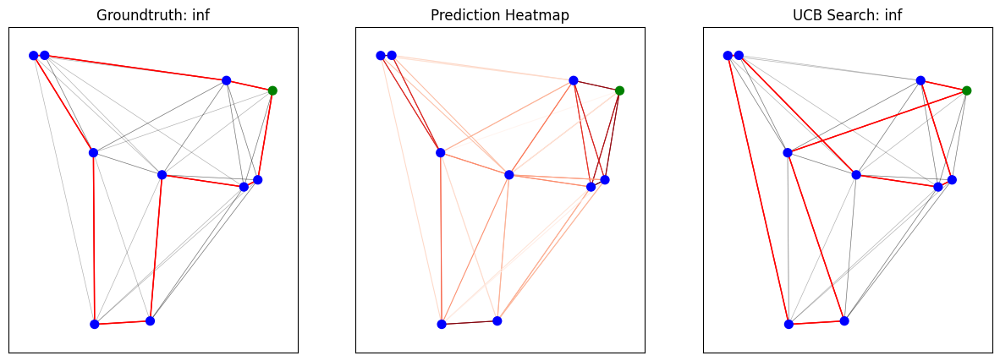

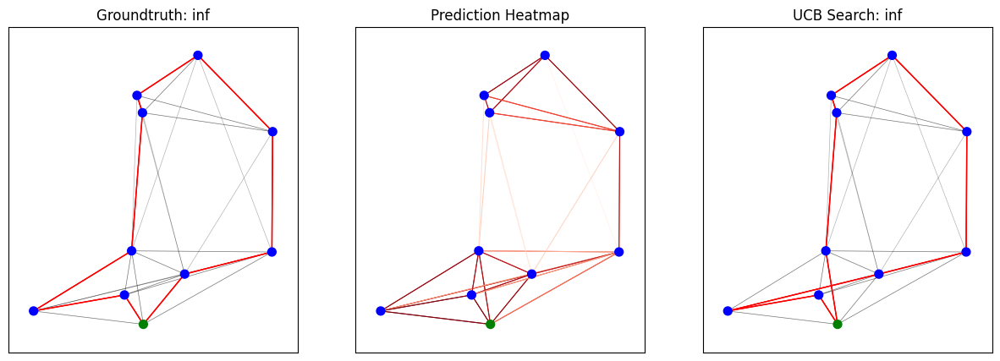

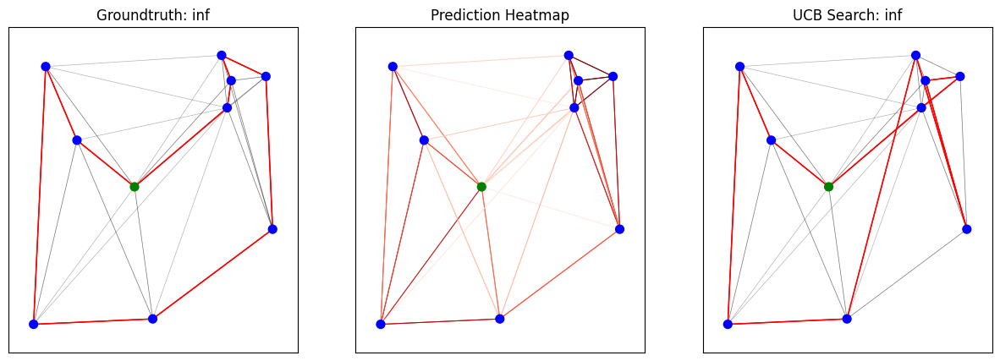

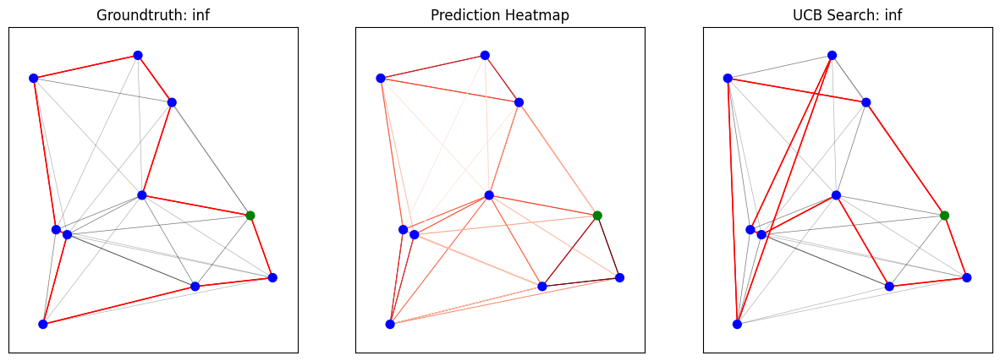

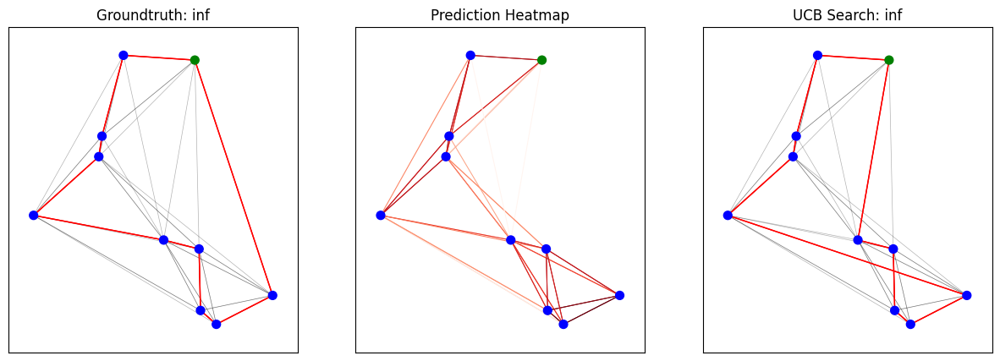

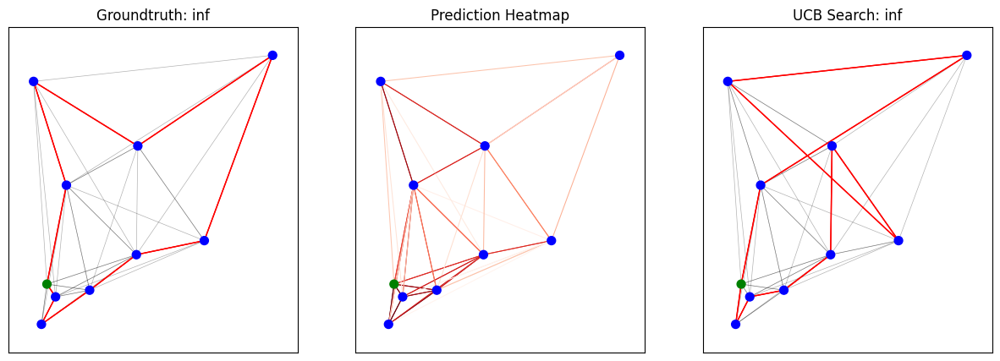

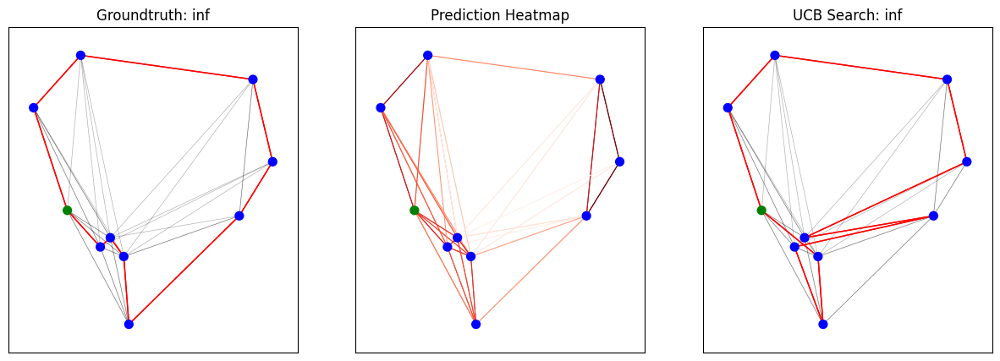

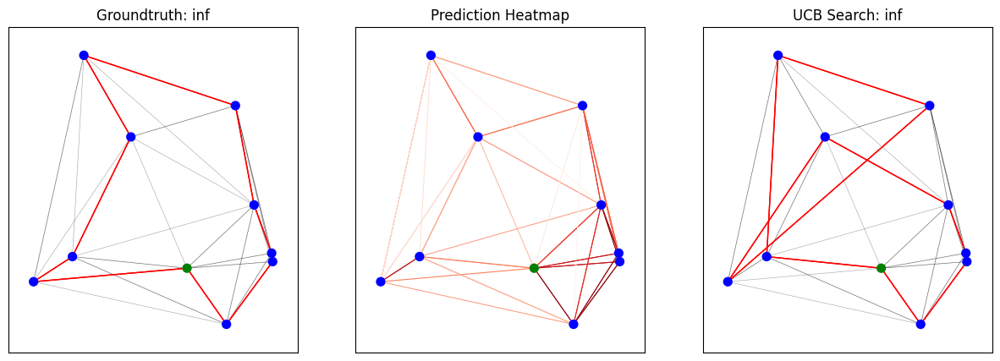

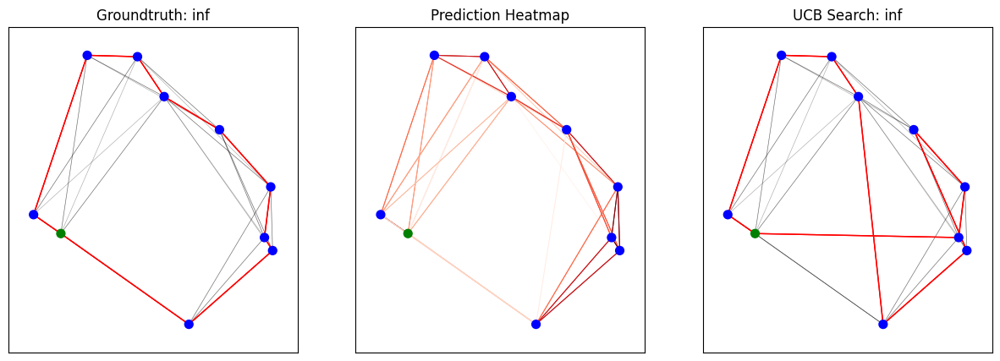

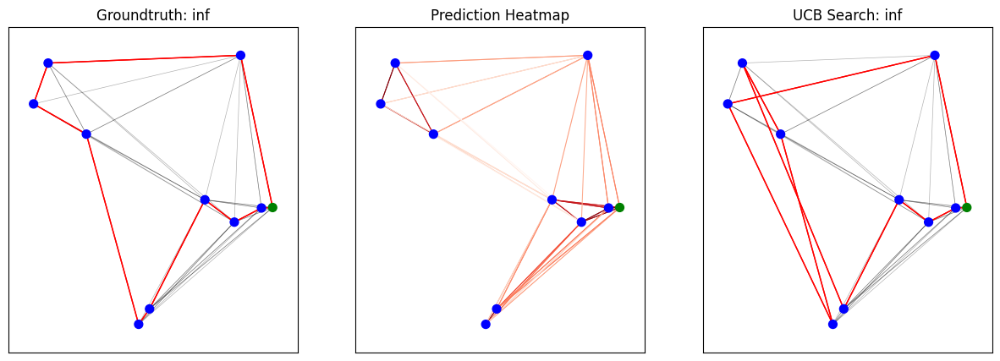

And UCB2


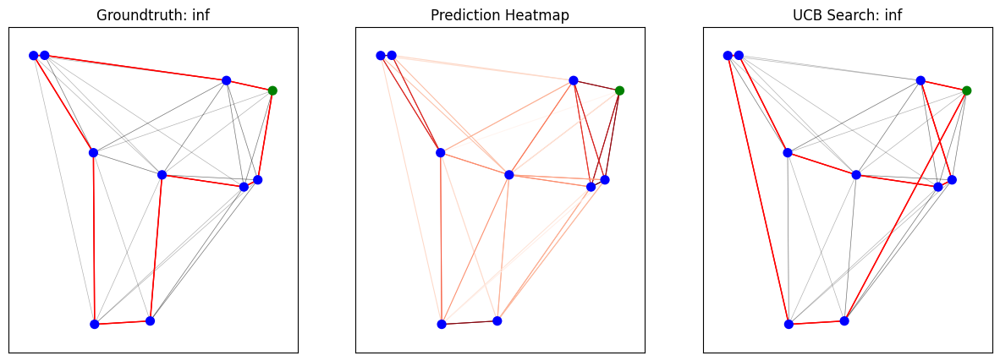

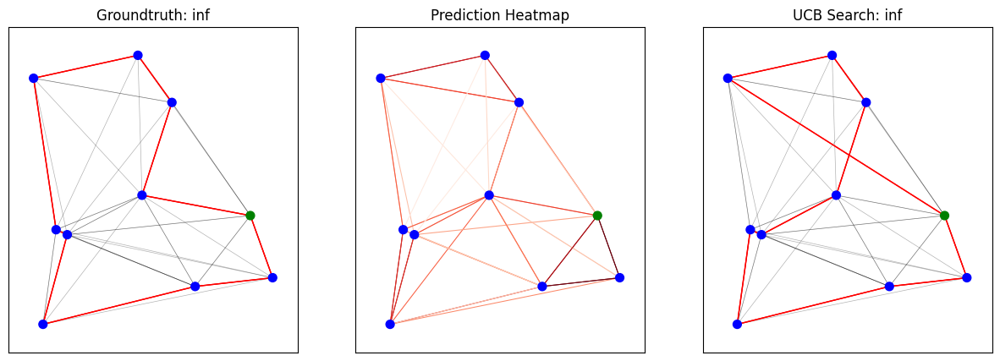

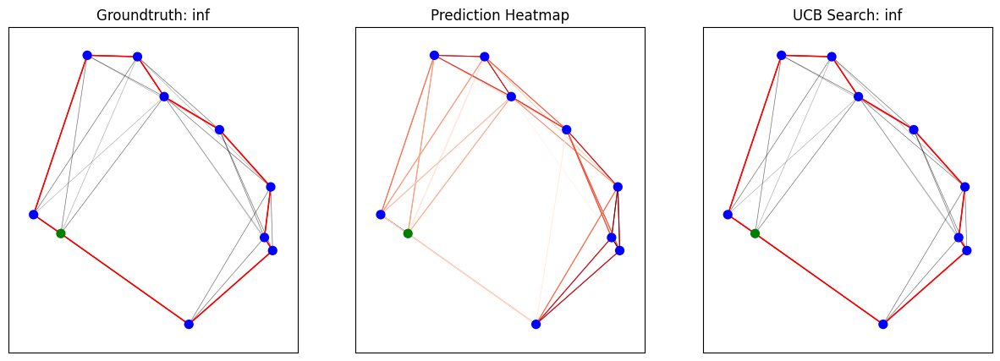

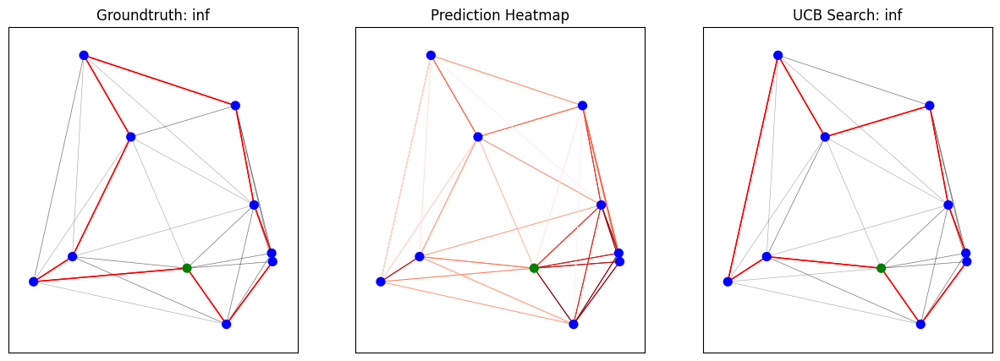

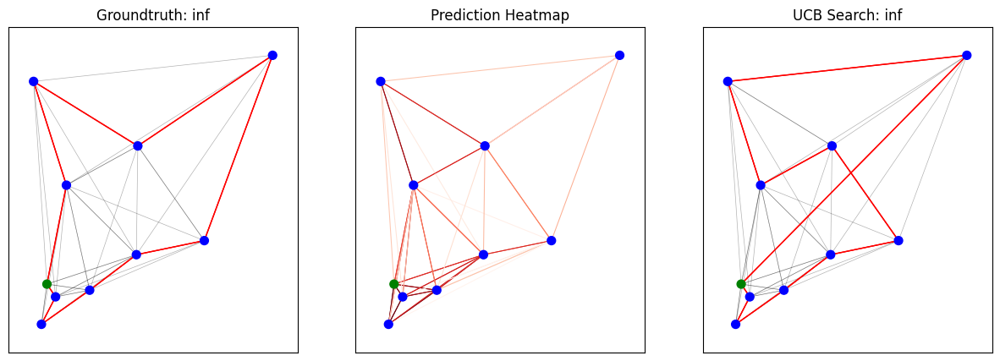

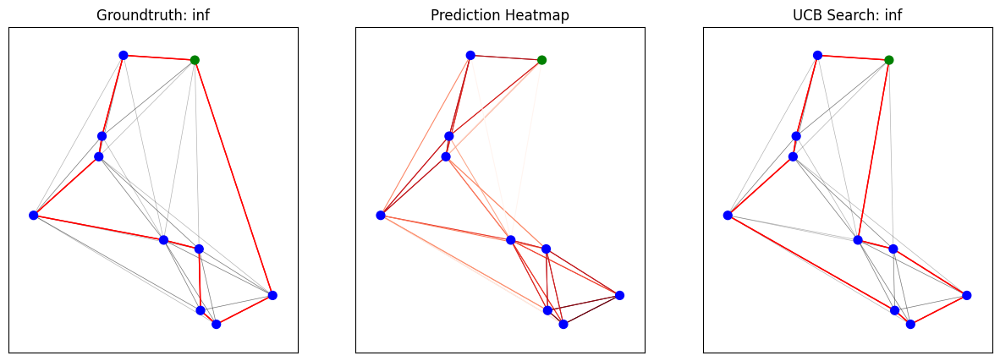

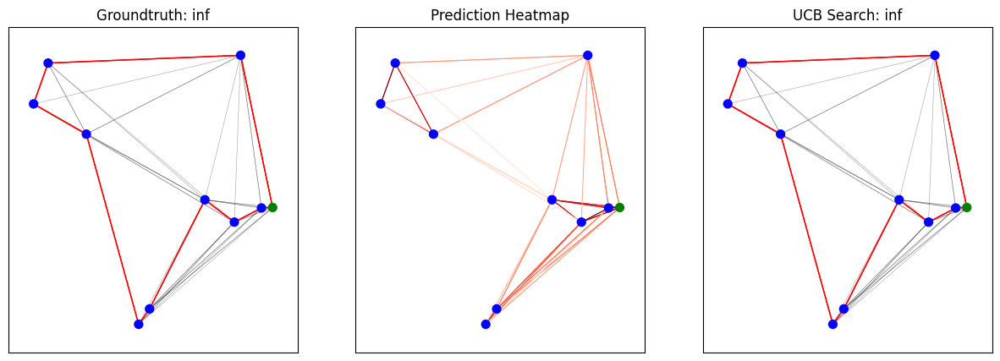

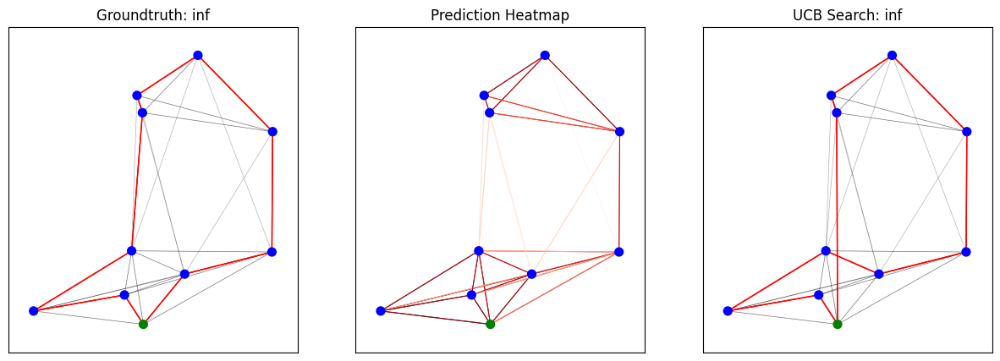

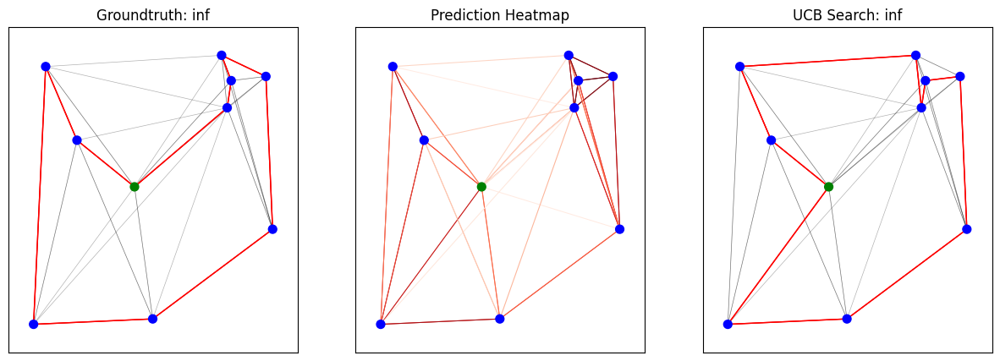

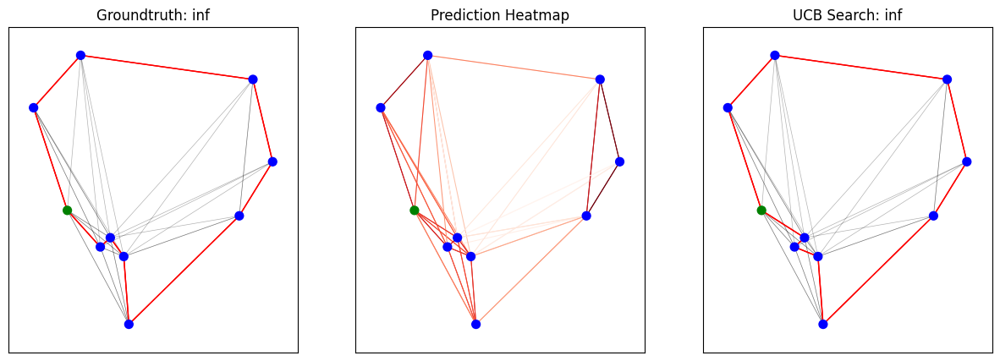

In [27]:
plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
print("And UCB2")
plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)

potential break in :  63
potential break in :  64
potential break in :  65
potential break in :  66
potential break in :  67
potential break in :  68
potential break in :  69
potential break in :  70
potential break in :  71
potential break in :  72
potential break in :  73
potential break in :  74
potential break in :  75
potential break in :  76
potential break in :  77
potential break in :  78
potential break in :  79
potential break in :  80
potential break in :  81
potential break in :  82
potential break in :  83
potential break in :  84
potential break in :  85
potential break in :  86
potential break in :  87
potential break in :  88
potential break in :  89
potential break in :  90
potential break in :  91
potential break in :  92
potential break in :  93
potential break in :  94
potential break in :  95
potential break in :  96
potential break in :  97
potential break in :  98
potential break in :  99
potential break in :  100
potential break in :  101
potential break in :  1

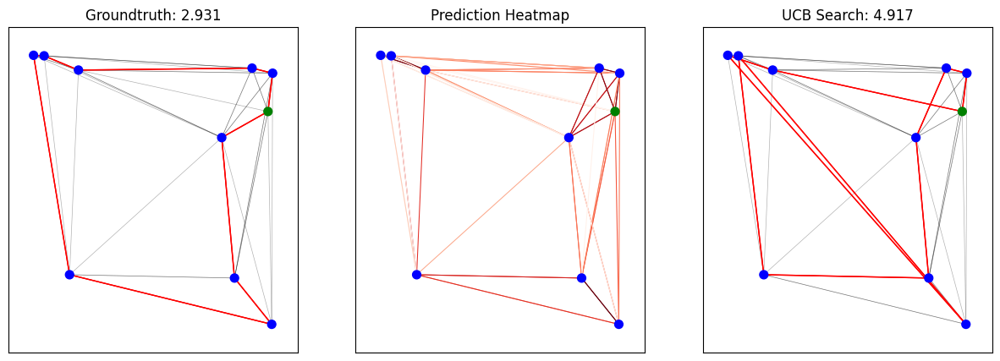

In [131]:
if notebook_mode==True:
    # Set evaluation mode
    net.eval()
    
    batch_size = 1
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    beam_size = config.beam_size
    test_filepath = config.test_filepath
    dataset = iter(GoogleTSPReader(num_nodes, num_neighbors, batch_size, test_filepath))
    batch = next(dataset)

    with torch.no_grad():
        # Convert batch to torch Variables

        edges_k_means = Variable(torch.LongTensor(batch.edges).type(dtypeFloat), requires_grad=False)
        edges_dist = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
        x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeFloat), requires_grad=False)
        nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
        y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeFloat), requires_grad=False)
        y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeFloat), requires_grad=False)
        
        # Compute class weights (if uncomputed)
        if type(edge_cw) != torch.Tensor:
            edge_labels = y_edges.cpu().numpy().flatten()
            edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
        
        # Forward pass
        y_preds, loss = net.forward(nodes_coord, edges_dist, edges_k_means, y_edges, edge_cw)
        
        y_UCB = 1- F.softmax(y_preds, dim=-1)
        
        y_UCB = y_UCB[:, :, :, 0]
        lenght = edges_dist[0]
        TS = UCBTreeSearch(y_UCB, lenght)
        # TS = UCBTreeSearch(y_edges[0], lenght)
        TSP_UCB = TS.return_TSP_approx(10_000)
        TSP_UCB = torch.tensor(TSP_UCB)
        TSP_UCB = TSP_UCB.unsqueeze(0)
            
        plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
        
        # plot_predictions_UCBsearch(nodes_coord[idx], edges_k_means[idx], edges_dist[idx], y_edges[idx], y_preds[idx], bs_nodes, num_plots=3)  
        # loss = loss.mean()
        
        # # Get batch beamsearch tour prediction

        # #bs_nodes = beamsearch_tour_nodes(
        # #    y_preds, beam_size, batch_size, num_nodes, dtypeFloat, dtypeLong, probs_type='logits')

        # # Compute mean tour length
        # pred_tour_len = mean_tour_len_nodes(edges_dist, bs_nodes)
        # gt_tour_len = np.mean(batch.tour_len)
        # print("Predicted tour length: {:.3f} (mean)\nGroundtruth tour length: {:.3f} (mean)".format(pred_tour_len, gt_tour_len))

        # # Sanity check
        # for idx, nodes in enumerate(bs_nodes):
        #     if not is_valid_tour(nodes, num_nodes):
        #         print(idx, " Invalid tour: ", nodes)

        # # Plot prediction visualizations
        # plot_predictions_beamsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, bs_nodes, num_plots=batch_size)

In [ ]:
if notebook_mode:
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    batch_size = config.batch_size
    train_filepath = config.train_filepath
    dataset = GoogleTSPReader(num_nodes, num_neighbors, batch_size, train_filepath)
    print("Number of batches of size {}: {}".format(batch_size, dataset.max_iter))

    t = time.time()
    batch = next(iter(dataset))  # Generate a batch of TSPs
    print("Batch generation took: {:.3f} sec".format(time.time() - t))

    print("edges:", batch.edges.shape)
    print("edges_values:", batch.edges_values.shape)
    print("edges_targets:", batch.edges_target.shape)
    print("nodes:", batch.nodes.shape)
    print("nodes_target:", batch.nodes_target.shape)
    print("nodes_coord:", batch.nodes_coord.shape)
    print("tour_nodes:", batch.tour_nodes.shape)
    print("tour_len:", batch.tour_len.shape)

    idx = 0
    f = plt.figure(figsize=(5, 5))
    a = f.add_subplot(111)
    plot_tsp(a, batch.nodes_coord[idx], batch.edges[idx], batch.edges_values[idx], batch.edges_target[idx])
    print(batch.edges_target[idx])

In [64]:
save_path = 'simple_net_model.pth'

# Save the model
torch.save(net.state_dict(), save_path)

In [38]:
from utils.UCB import UCBTreeSearch, plot_predictions_UCBsearch, UCBSearch_with_batch
# plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
# print("And UCB2")
print(edges_dist[0])
# plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)

tensor([[0.0000,    inf,    inf,    inf,    inf,    inf,    inf,    inf,    inf,
            inf],
        [0.4109, 0.0000, 0.6389, 0.9390, 0.6952, 0.1693, 0.3719, 0.0752, 0.1441,
         0.5746],
        [0.3653, 0.6389, 0.0000, 0.4507, 0.7960, 0.7854, 0.5145, 0.7119, 0.7619,
         0.5635],
        [0.5339, 0.9390, 0.4507, 0.0000, 0.7016, 1.1066, 0.9399, 0.9981, 1.0194,
         0.5263],
        [0.4685, 0.6952, 0.7960, 0.7016, 0.0000, 0.8329, 0.9650, 0.7023, 0.6657,
         0.2325],
        [0.5802, 0.1693, 0.7854, 1.1066, 0.8329, 0.0000, 0.4158, 0.1317, 0.1770,
         0.7348],
        [0.5347, 0.3719, 0.5145, 0.9399, 0.9650, 0.4158, 0.0000, 0.4329, 0.5103,
         0.7780],
        [0.4656, 0.0752, 0.7119, 0.9981, 0.7023, 0.1317, 0.4329, 0.0000, 0.0778,
         0.6050],
        [0.4858, 0.1441, 0.7619, 1.0194, 0.6657, 0.1770, 0.5103, 0.0778, 0.0000,
         0.5933],
        [0.2516, 0.5746, 0.5635, 0.5263, 0.2325, 0.7348, 0.7780, 0.6050, 0.5933,
         0.0000]])


tensor([[0.0000, 0.5097, 0.2152, 0.5640, 0.6495, 0.6773, 0.5212, 0.7513, 0.0915,
         0.5707],
        [0.5097, 0.0000, 0.4457, 0.0544, 0.4718, 0.9427, 0.6916, 0.2419, 0.4655,
         0.5808],
        [0.2152, 0.4457, 0.0000, 0.4970, 0.4446, 0.5421, 0.3352, 0.6685, 0.1241,
         0.3564],
        [0.5640, 0.0544, 0.4970, 0.0000, 0.4855, 0.9850, 0.7315, 0.1881, 0.5197,
         0.6110],
        [0.6495, 0.4718, 0.4446, 0.4855, 0.0000, 0.6453, 0.4014, 0.5439, 0.5598,
         0.2124],
        [0.6773, 0.9427, 0.5421, 0.9850, 0.6453, 0.0000, 0.2588, 1.1200, 0.6195,
         0.4336],
        [0.5212, 0.6916, 0.3352, 0.7315, 0.4014, 0.2588, 0.0000, 0.8616, 0.4423,
         0.1913],
        [0.7513, 0.2419, 0.6685, 0.1881, 0.5439, 1.1200, 0.8616, 0.0000, 0.7033,
         0.7135],
        [0.0915, 0.4655, 0.1241, 0.5197, 0.5598, 0.6195, 0.4423, 0.7033, 0.0000,
         0.4804],
        [0.5707, 0.5808, 0.3564, 0.6110, 0.2124, 0.4336, 0.1913, 0.7135, 0.4804,
         0.0000]])
begin
ten

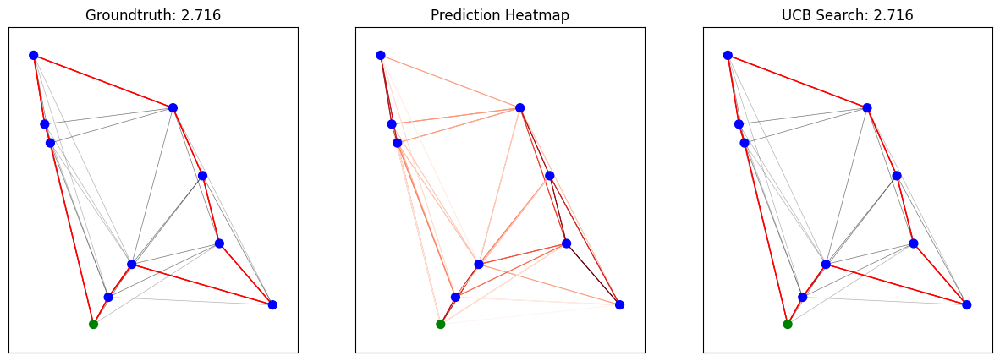

In [50]:
from utils.UCB2 import UCBSearch_with_batch_UCB2
if notebook_mode==True:
    # Set evaluation mode
    net.eval()
    
    batch_size = 1
    num_nodes = config.num_nodes
    num_neighbors = config.num_neighbors
    beam_size = config.beam_size
    test_filepath = config.test_filepath
    dataset = iter(GoogleTSPReader(num_nodes, num_neighbors, batch_size, test_filepath))
    batch = next(dataset)

    with torch.no_grad():
        # Convert batch to torch Variables

        edges_k_means = Variable(torch.LongTensor(batch.edges).type(dtypeFloat), requires_grad=False)
        edges_dist = Variable(torch.FloatTensor(batch.edges_values).type(dtypeFloat), requires_grad=False)
        x_nodes = Variable(torch.LongTensor(batch.nodes).type(dtypeFloat), requires_grad=False)
        nodes_coord = Variable(torch.FloatTensor(batch.nodes_coord).type(dtypeFloat), requires_grad=False)
        y_edges = Variable(torch.LongTensor(batch.edges_target).type(dtypeFloat), requires_grad=False)
        y_nodes = Variable(torch.LongTensor(batch.nodes_target).type(dtypeFloat), requires_grad=False)
        
        # Compute class weights (if uncomputed)
        if type(edge_cw) != torch.Tensor:
            edge_labels = y_edges.cpu().numpy().flatten()
            edge_cw = compute_class_weight("balanced", classes=np.unique(edge_labels), y=edge_labels)
        
        # Forward pass
        dist_t0 = edges_dist[0]
        print(dist_t0)
        y_preds, loss = net.forward(nodes_coord, edges_dist, edges_k_means, y_edges, edge_cw)
        
        y_UCB = 1- F.softmax(y_preds, dim=-1)
        
        y_UCB = y_UCB[:, :, :, 0]
        TSP_UCB = UCBSearch_with_batch(y_UCB, edges_dist)
        # dist_t1 = edges_dist[0]
        # print(dist_t1)
        TSP_UCB2 = UCBSearch_with_batch_UCB2(y_UCB, edges_dist)
        dist_t2 = edges_dist[0]
        # print(dist_t2)
        # bs = beamSearch_with_batch(y_UCB, edges_dist)
        # dist_t3 = edges_dist[0]
        # print(dist_t3)
            
        plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
        print("And UCB2")
        plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)
        print("And BeamSearch")
        plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB, num_plots=batch_size)
        print("And UCB2")
        plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, TSP_UCB2, num_plots=batch_size)
        # print("And BeamSearch")
        # plot_predictions_UCBsearch(nodes_coord, edges_k_means, edges_dist, y_edges, y_preds, bs, num_plots=batch_size)

In [43]:
print(dist_t0)
# print(dist_t1)
# # print(dist_t2)
# # print(dist_t3)

tensor([[0.0000,    inf,    inf,    inf,    inf,    inf,    inf,    inf,    inf,
            inf],
        [0.9549, 0.0000, 0.7364, 0.1683, 0.5486, 0.7315, 0.3513, 0.7008, 0.6420,
         0.8278],
        [0.4844, 0.7364, 0.0000, 0.8865, 0.7907, 0.2376, 0.3984, 0.0911, 1.0379,
         0.6918],
        [1.0504, 0.1683, 0.8865, 0.0000, 0.5336, 0.8528, 0.5139, 0.8582, 0.5570,
         0.8682],
        [0.6821, 0.5486, 0.7907, 0.5336, 0.0000, 0.6197, 0.6298, 0.8199, 0.2555,
         0.3816],
        [0.2770, 0.7315, 0.2376, 0.8528, 0.6197, 0.0000, 0.4627, 0.3153, 0.8749,
         0.4585],
        [0.7294, 0.3513, 0.3984, 0.5139, 0.6298, 0.4627, 0.0000, 0.3520, 0.8261,
         0.7418],
        [0.5727, 0.7008, 0.0911, 0.8582, 0.8199, 0.3153, 0.3520, 0.0000, 1.0599,
         0.7584],
        [0.9256, 0.6420, 1.0379, 0.5570, 0.2555, 0.8749, 0.8261, 1.0599, 0.0000,
         0.5922],
        [0.3656, 0.8278, 0.6918, 0.8682, 0.3816, 0.4585, 0.7418, 0.7584, 0.5922,
         0.0000]])
